In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pyreadstat
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

In [4]:
# calling volumes
subcortical_vol_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\aseg_20231117.csv"
subcortical_vol = pd.read_csv(subcortical_vol_file_path)
subcortical_vol = pd.DataFrame(subcortical_vol)

# Left Hemisphere
lh_aparc_area_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\lh_aparc_area_20231117.csv"
lh_aparc_area = pd.read_csv(lh_aparc_area_file_path)
lh_aparc_area = pd.DataFrame(lh_aparc_area)

lh_aparc_meancurv_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\lh_aparc_meancurv_20231117.csv"
lh_aparc_meancurv = pd.read_csv(lh_aparc_meancurv_file_path)
lh_aparc_meancurv = pd.DataFrame(lh_aparc_meancurv)

lh_aparc_thickness_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\lh_aparc_thickness_20231117.csv"
lh_aparc_thickness = pd.read_csv(lh_aparc_thickness_file_path)
lh_aparc_thickness = pd.DataFrame(lh_aparc_thickness)

lh_aparc_volume_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\lh_aparc_volume_20231117.csv"
lh_aparc_volume = pd.read_csv(lh_aparc_volume_file_path)
lh_aparc_volume = pd.DataFrame(lh_aparc_volume)


# Right Hemisphere
lh_aparc_meancurv_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\lh_aparc_meancurv_20231117.csv"
lh_aparc_meancurv = pd.read_csv(lh_aparc_meancurv_file_path)
lh_aparc_meancurv = pd.DataFrame(lh_aparc_meancurv)

rh_aparc_meancurv_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\rh_aparc_meancurv_20231117.csv"
rh_aparc_meancurv = pd.read_csv(rh_aparc_meancurv_file_path)
rh_aparc_meancurv = pd.DataFrame(rh_aparc_meancurv)

rh_aparc_thickness_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\rh_aparc_thickness_20231117.csv"
rh_aparc_thickness = pd.read_csv(rh_aparc_thickness_file_path)
rh_aparc_thickness = pd.DataFrame(rh_aparc_thickness)

rh_aparc_volume_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\rh_aparc_volume_20231117.csv"
rh_aparc_volume = pd.read_csv(rh_aparc_volume_file_path)
rh_aparc_volume = pd.DataFrame(rh_aparc_volume)



In [5]:
import os
main_path = r'Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes'
folder_name = 'volumetrics_to_briefa'  
save_path = os.path.join(main_path, folder_name)
os.makedirs(save_path, exist_ok=True)

# save_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Biomarkers\lh_aparc_meancurv_briefa" # Update this path to your desired folder


In [6]:
# Check for null values in each column
lh_aparc_meancurv_nulls = lh_aparc_meancurv.isnull().sum()

lh_aparc_meancurv_nulls_df = pd.DataFrame({
    'Column': lh_aparc_meancurv_nulls.index,
    'Number of Nulls': lh_aparc_meancurv_nulls.values
})

lh_aparc_meancurv_nulls_df_transposed = lh_aparc_meancurv_nulls_df.T

print("Null values in lh_aparc_meancurv:")
print(lh_aparc_meancurv_nulls_df)
lh_aparc_meancurv_nulls_df_transposed.to_csv(r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\lh_aparc_meancurv_nulls.csv", index=False)



Null values in lh_aparc_meancurv:
                              Column  Number of Nulls
0                         subject_id                0
1                              visit                0
2                        checkin_bin                0
3                        exposurebin                0
4                         age_decade                0
5                   racecat_combined                0
6                           eduyears                0
7                         totyr_foot               56
8                        chiiseas_pf               56
9                         chiiyrs_pf               56
10                       chiiseas_pl               56
11                        chiiyrs_pl               56
12                       chiiseas_pg               56
13                        chiiyrs_pg               56
14                   timepoint_aparc               11
15                FreeSurfer_Version               11
16                             Atlas            

In [7]:
lh_aparc_meancurv = lh_aparc_meancurv.drop(columns=lh_aparc_meancurv.loc[:,'subject_id':'Atlas'].columns)
# lh_aparc_meancurv = lh_aparc_meancurv.drop(columns='p_PDGFRbeta_FLAG_other')

lh_aparc_meancurv.head()

,lh_bankssts_meancurv,lh_caudalanteriorcingulate_meanc,lh_caudalmiddlefrontal_meancurv,lh_cuneus_meancurv,lh_entorhinal_meancurv,lh_fusiform_meancurv,lh_inferiorparietal_meancurv,lh_inferiortemporal_meancurv,lh_isthmuscingulate_meancurv,lh_lateraloccipital_meancurv,...,lh_rostralanteriorcingulate_mean,lh_rostralmiddlefrontal_meancurv,lh_superiorfrontal_meancurv,lh_superiorparietal_meancurv,lh_superiortemporal_meancurv,lh_supramarginal_meancurv,lh_frontalpole_meancurv,lh_temporalpole_meancurv,lh_transversetemporal_meancurv,lh_insula_meancurv
0,0.105,0.107,0.102,0.126,0.134,0.120,0.107,0.126,0.130,0.122,...,0.119,0.125,0.116,0.111,0.105,0.114,0.144,0.170,0.089,0.127
1,0.100,0.096,0.103,0.147,0.130,0.121,0.115,0.131,0.135,0.128,...,0.119,0.122,0.108,0.116,0.105,0.121,0.153,0.146,0.135,0.138
2,0.109,0.146,0.110,0.126,0.132,0.123,0.119,0.138,0.125,0.133,...,0.127,0.136,0.124,0.115,0.119,0.118,0.149,0.128,0.146,0.121
3,0.113,0.141,0.117,0.138,0.131,0.131,0.117,0.147,0.117,0.134,...,0.158,0.143,0.122,0.126,0.110,0.129,0.154,0.155,0.102,0.138
4,0.105,0.134,0.103,0.136,0.117,0.122,0.119,0.127,0.126,0.131,...,0.129,0.132,0.115,0.124,0.105,0.135,0.170,0.167,0.131,0.116


In [8]:
## USe this if there are a couple of features/column that you want to remove manually (all are zero, or they don't represent anything meaningful)
# lh_aparc_meancurv = lh_aparc_meancurv.drop(columns=['p_Ab40_FLAG_below_ref_range',
#                               'p_Ab42_FLAG_below_ref_range',
#                               'p_GFAP_FLAG_below_ref_range', 
#                               'p_NfL_FLAG_below_ref_range',
#                               'dxcte_totaltau_plasma_flag_dv'])
lh_aparc_meancurv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 34 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   lh_bankssts_meancurv              225 non-null    float64
 1   lh_caudalanteriorcingulate_meanc  225 non-null    float64
 2   lh_caudalmiddlefrontal_meancurv   225 non-null    float64
 3   lh_cuneus_meancurv                225 non-null    float64
 4   lh_entorhinal_meancurv            225 non-null    float64
 5   lh_fusiform_meancurv              225 non-null    float64
 6   lh_inferiorparietal_meancurv      225 non-null    float64
 7   lh_inferiortemporal_meancurv      225 non-null    float64
 8   lh_isthmuscingulate_meancurv      225 non-null    float64
 9   lh_lateraloccipital_meancurv      225 non-null    float64
 10  lh_lateralorbitofrontal_meancurv  225 non-null    float64
 11  lh_lingual_meancurv               225 non-null    float64
 12  lh_media

In [9]:
lh_aparc_meancurv.head(10)

,lh_bankssts_meancurv,lh_caudalanteriorcingulate_meanc,lh_caudalmiddlefrontal_meancurv,lh_cuneus_meancurv,lh_entorhinal_meancurv,lh_fusiform_meancurv,lh_inferiorparietal_meancurv,lh_inferiortemporal_meancurv,lh_isthmuscingulate_meancurv,lh_lateraloccipital_meancurv,...,lh_rostralanteriorcingulate_mean,lh_rostralmiddlefrontal_meancurv,lh_superiorfrontal_meancurv,lh_superiorparietal_meancurv,lh_superiortemporal_meancurv,lh_supramarginal_meancurv,lh_frontalpole_meancurv,lh_temporalpole_meancurv,lh_transversetemporal_meancurv,lh_insula_meancurv
0,0.105,0.107,0.102,0.126,0.134,0.120,0.107,0.126,0.130,0.122,...,0.119,0.125,0.116,0.111,0.105,0.114,0.144,0.170,0.089,0.127
1,0.100,0.096,0.103,0.147,0.130,0.121,0.115,0.131,0.135,0.128,...,0.119,0.122,0.108,0.116,0.105,0.121,0.153,0.146,0.135,0.138
2,0.109,0.146,0.110,0.126,0.132,0.123,0.119,0.138,0.125,0.133,...,0.127,0.136,0.124,0.115,0.119,0.118,0.149,0.128,0.146,0.121
3,0.113,0.141,0.117,0.138,0.131,0.131,0.117,0.147,0.117,0.134,...,0.158,0.143,0.122,0.126,0.110,0.129,0.154,0.155,0.102,0.138
4,0.105,0.134,0.103,0.136,0.117,0.122,0.119,0.127,0.126,0.131,...,0.129,0.132,0.115,0.124,0.105,0.135,0.170,0.167,0.131,0.116
5,0.120,0.126,0.111,0.139,0.105,0.123,0.127,0.127,0.124,0.139,...,0.141,0.133,0.120,0.125,0.114,0.130,0.191,0.154,0.135,0.119
6,0.112,0.129,0.112,0.147,0.103,0.118,0.122,0.151,0.126,0.139,...,0.145,0.138,0.120,0.115,0.114,0.127,0.181,0.174,0.112,0.139
7,0.094,0.124,0.130,0.132,0.117,0.127,0.115,0.119,0.124,0.126,...,0.135,0.124,0.119,0.108,0.098,0.113,0.137,0.155,0.115,0.121
8,0.106,0.092,0.114,0.127,0.145,0.121,0.116,0.128,0.113,0.128,...,0.112,0.128,0.111,0.109,0.108,0.118,0.120,0.163,0.126,0.115
9,0.081,0.114,0.106,0.136,0.113,0.122,0.115,0.123,0.125,0.128,...,0.120,0.123,0.117,0.115,0.095,0.122,0.167,0.119,0.116,0.124


In [10]:
# Calculate the mean for each column, ignoring NaNs
mean_values = lh_aparc_meancurv.mean()

lh_aparc_meancurv = lh_aparc_meancurv.fillna(mean_values)

lh_aparc_meancurv.head()

,lh_bankssts_meancurv,lh_caudalanteriorcingulate_meanc,lh_caudalmiddlefrontal_meancurv,lh_cuneus_meancurv,lh_entorhinal_meancurv,lh_fusiform_meancurv,lh_inferiorparietal_meancurv,lh_inferiortemporal_meancurv,lh_isthmuscingulate_meancurv,lh_lateraloccipital_meancurv,...,lh_rostralanteriorcingulate_mean,lh_rostralmiddlefrontal_meancurv,lh_superiorfrontal_meancurv,lh_superiorparietal_meancurv,lh_superiortemporal_meancurv,lh_supramarginal_meancurv,lh_frontalpole_meancurv,lh_temporalpole_meancurv,lh_transversetemporal_meancurv,lh_insula_meancurv
0,0.105,0.107,0.102,0.126,0.134,0.120,0.107,0.126,0.130,0.122,...,0.119,0.125,0.116,0.111,0.105,0.114,0.144,0.170,0.089,0.127
1,0.100,0.096,0.103,0.147,0.130,0.121,0.115,0.131,0.135,0.128,...,0.119,0.122,0.108,0.116,0.105,0.121,0.153,0.146,0.135,0.138
2,0.109,0.146,0.110,0.126,0.132,0.123,0.119,0.138,0.125,0.133,...,0.127,0.136,0.124,0.115,0.119,0.118,0.149,0.128,0.146,0.121
3,0.113,0.141,0.117,0.138,0.131,0.131,0.117,0.147,0.117,0.134,...,0.158,0.143,0.122,0.126,0.110,0.129,0.154,0.155,0.102,0.138
4,0.105,0.134,0.103,0.136,0.117,0.122,0.119,0.127,0.126,0.131,...,0.129,0.132,0.115,0.124,0.105,0.135,0.170,0.167,0.131,0.116


In [11]:
# calling Neuropsychiatric Measurements

briefa_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\briefa_20231117.csv"
briefa = pd.read_csv(briefa_file_path)
briefa = pd.DataFrame(briefa)


In [12]:
# Check for null values in each column
briefa_nulls = briefa.isnull().sum()

briefa_nulls_df = pd.DataFrame({
    'Column': briefa_nulls.index,
    'Number of Nulls': briefa_nulls.values
})

briefa_nulls_df_transposed = briefa_nulls_df.T

print("Null values in briefa:")
print(briefa_nulls_df)
briefa_nulls_df_transposed.to_csv(r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\briefa_nulls.csv", index=False)


Null values in briefa:
          Column  Number of Nulls
0     subject_id                0
1          visit                0
2    checkin_bin                0
3    exposurebin                0
4     age_decade                0
..           ...              ...
102      workorg                0
103    upseteasy                0
104    impulsive                0
105       pickup                0
106     complete                0

[107 rows x 2 columns]


In [13]:
briefa.head()

,subject_id,visit,checkin_bin,exposurebin,age_decade,racecat_combined,eduyears,totyr_foot,chiiseas_pf,chiiyrs_pf,...,activityorg,getover,onething,moodchange,consequence,workorg,upseteasy,impulsive,pickup,complete
0,1001,1,2,1,1,5,16.0,7.0,4335.4,2167.7,...,2,1,2,1,1,2,2,1,1,2
1,1002,1,2,1,1,5,15.0,14.0,10363.1,5708.1,...,3,3,3,2,3,3,3,3,2,3
2,1003,1,2,1,1,5,18.0,12.0,6685.4,4863.9,...,3,3,3,3,2,3,3,3,1,2
3,1004,1,1,1,2,5,16.0,16.0,7701.2,6448.9,...,1,1,1,1,1,1,2,1,1,1
4,1005,1,3,0,2,5,21.0,NaN,NaN,NaN,...,1,2,1,1,1,1,1,1,1,1


In [14]:
briefa = briefa.drop(columns=briefa.loc[:,'subject_id':'chiiyrs_pg'].columns)
briefa = briefa.drop(columns=briefa.loc[:,'negativ':'complete'].columns)
briefa.head()

,mi,tmi,gec,tgec,bri,tbri,inhibit,shift,emotcont,selfmon,initiate,workmem,planorg,taskmon,orgmat
0,75,64,114,57,39,46,12,9,11,7,14,17,20,13,11
1,101,85,171,85,70,79,17,15,23,15,19,24,27,15,16
2,90,77,158,79,68,77,15,14,27,12,20,22,22,14,12
3,43,40,81,42,38,46,9,8,15,6,9,8,11,7,8
4,43,39,81,41,38,45,9,11,12,6,10,8,10,7,8


In [15]:
briefa.describe()

,mi,tmi,gec,tgec,bri,tbri,inhibit,shift,emotcont,selfmon,initiate,workmem,planorg,taskmon,orgmat
count,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000
mean,63.682203,56.724576,110.169492,56.508475,46.487288,55.203390,12.169492,9.690678,15.758475,8.868644,12.605932,13.758475,15.338983,9.466102,12.512712
std,19.879120,16.771696,33.473344,17.217382,14.657067,16.438698,3.606861,3.378543,5.769042,3.063115,4.101039,4.922909,5.199379,2.946855,4.335387
min,40.000000,36.000000,70.000000,35.000000,30.000000,36.000000,8.000000,6.000000,10.000000,6.000000,8.000000,8.000000,10.000000,6.000000,8.000000
25%,45.000000,41.000000,79.750000,41.000000,34.000000,41.000000,9.000000,6.000000,10.000000,6.000000,9.000000,9.000000,10.000000,6.000000,9.000000
50%,60.000000,53.000000,104.500000,54.000000,43.000000,51.000000,11.000000,9.000000,14.000000,8.000000,12.000000,13.000000,14.000000,9.000000,11.000000
75%,79.250000,68.250000,136.000000,69.000000,57.000000,67.250000,14.000000,12.000000,20.000000,11.000000,16.000000,18.000000,19.250000,12.000000,15.000000
max,116.000000,104.000000,204.000000,108.000000,88.000000,105.000000,23.000000,18.000000,30.000000,18.000000,23.000000,24.000000,29.000000,18.000000,24.000000


In [16]:
lh_aparc_meancurv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 34 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   lh_bankssts_meancurv              236 non-null    float64
 1   lh_caudalanteriorcingulate_meanc  236 non-null    float64
 2   lh_caudalmiddlefrontal_meancurv   236 non-null    float64
 3   lh_cuneus_meancurv                236 non-null    float64
 4   lh_entorhinal_meancurv            236 non-null    float64
 5   lh_fusiform_meancurv              236 non-null    float64
 6   lh_inferiorparietal_meancurv      236 non-null    float64
 7   lh_inferiortemporal_meancurv      236 non-null    float64
 8   lh_isthmuscingulate_meancurv      236 non-null    float64
 9   lh_lateraloccipital_meancurv      236 non-null    float64
 10  lh_lateralorbitofrontal_meancurv  236 non-null    float64
 11  lh_lingual_meancurv               236 non-null    float64
 12  lh_media

In [17]:
import os
main_path = r'Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes'
folder_name = 'lh_aparc_meancurv_to_briefa'  
save_path = os.path.join(main_path, folder_name)
os.makedirs(save_path, exist_ok=True)


In [18]:
categories_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\categories.csv"
categories_df = pd.read_csv(categories_file_path)
new_column = categories_df['checkin_bin']
briefa['category'] = new_column
print(briefa.head())

lh_aparc_meancurv['category'] = new_column
print(lh_aparc_meancurv.head())


    mi  tmi  gec  tgec  bri  tbri  inhibit  shift  emotcont  selfmon  \
0   75   64  114    57   39    46       12      9        11        7   
1  101   85  171    85   70    79       17     15        23       15   
2   90   77  158    79   68    77       15     14        27       12   
3   43   40   81    42   38    46        9      8        15        6   
4   43   39   81    41   38    45        9     11        12        6   

   initiate  workmem  planorg  taskmon  orgmat  category  
0        14       17       20       13      11         2  
1        19       24       27       15      16         2  
2        20       22       22       14      12         2  
3         9        8       11        7       8         1  
4        10        8       10        7       8         3  
   lh_bankssts_meancurv  lh_caudalanteriorcingulate_meanc  \
0                 0.105                             0.107   
1                 0.100                             0.096   
2                 0.109       

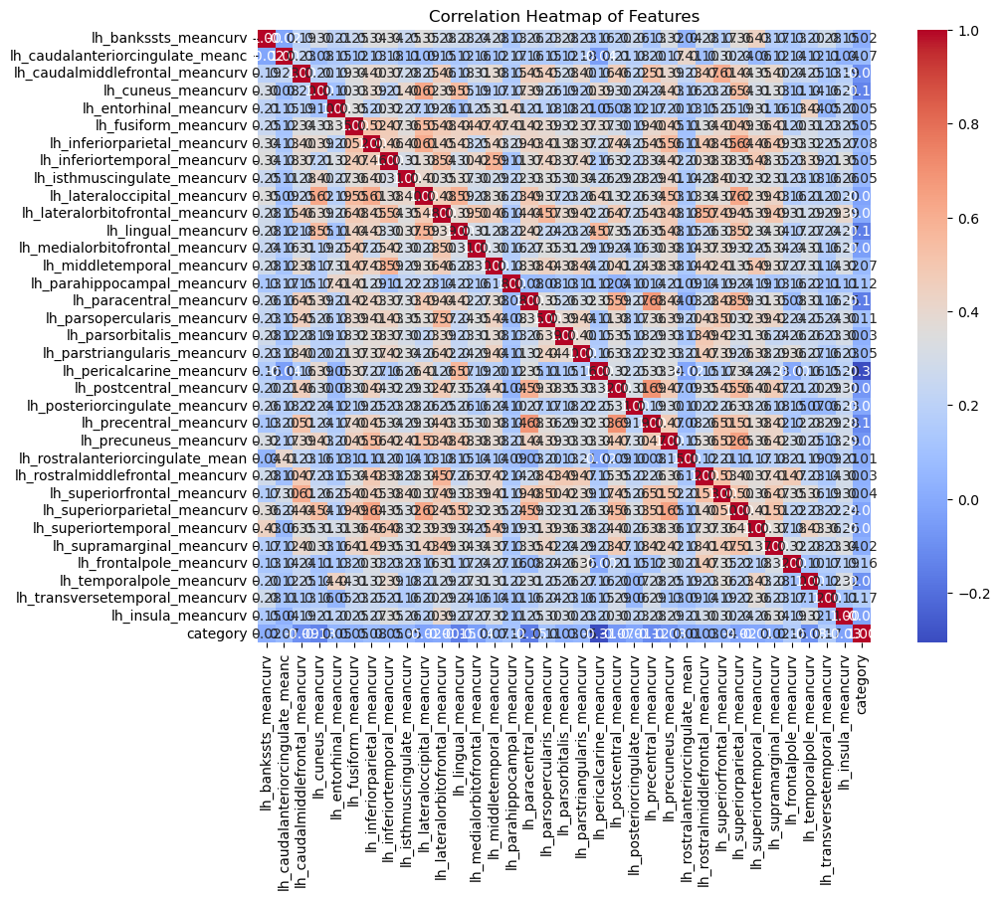

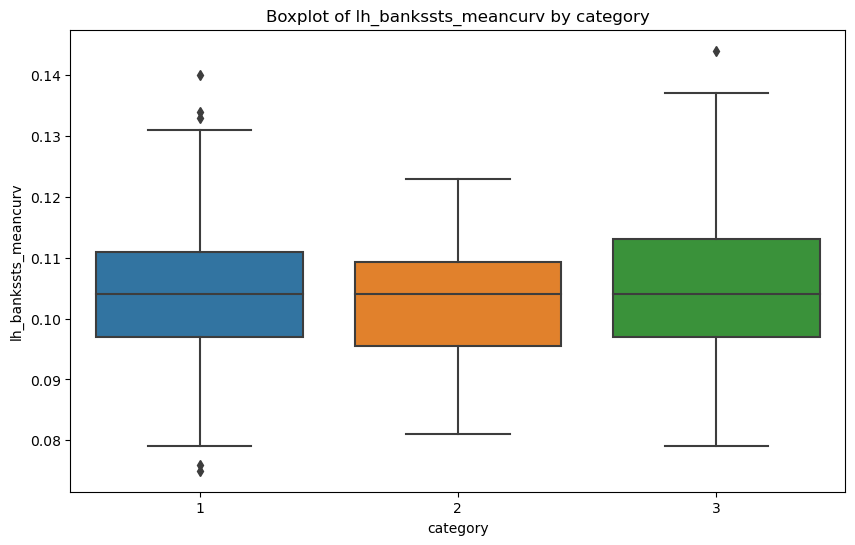

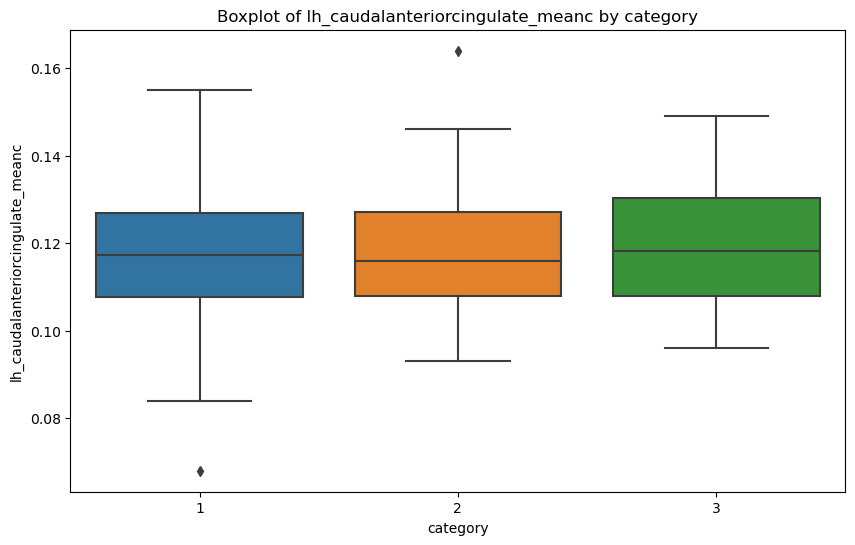

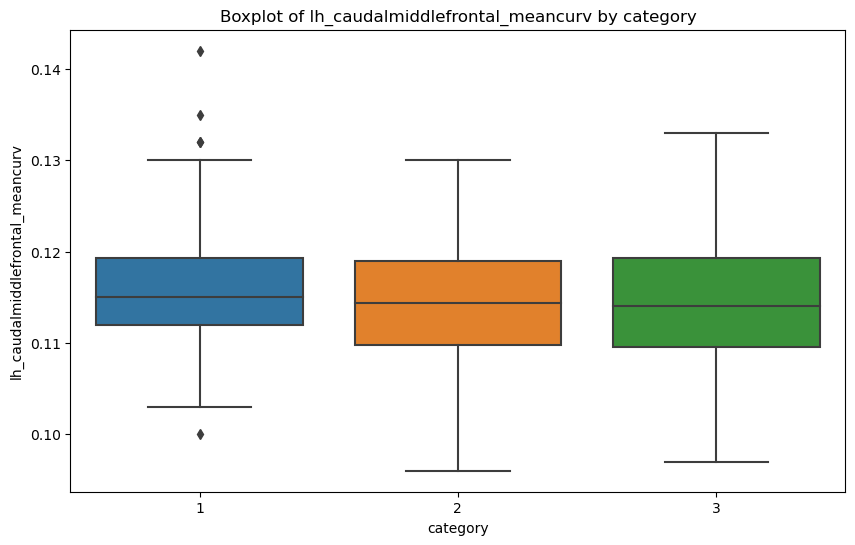

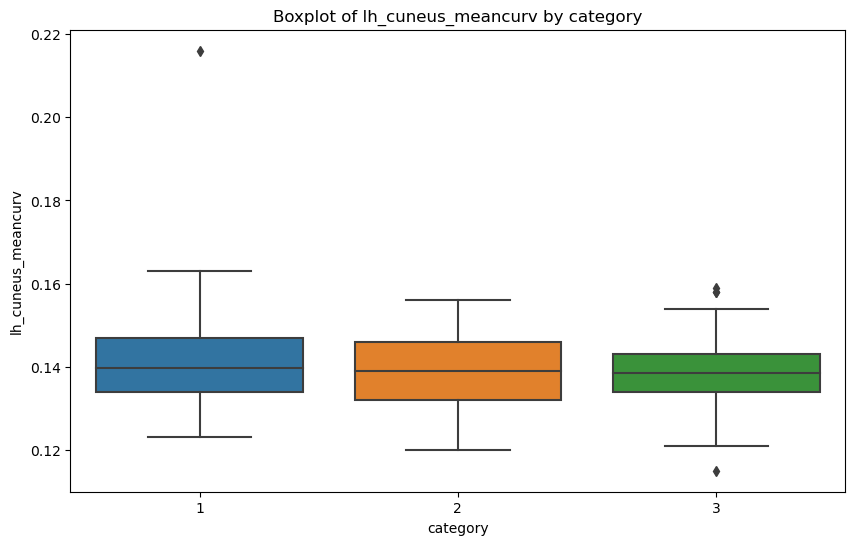

...

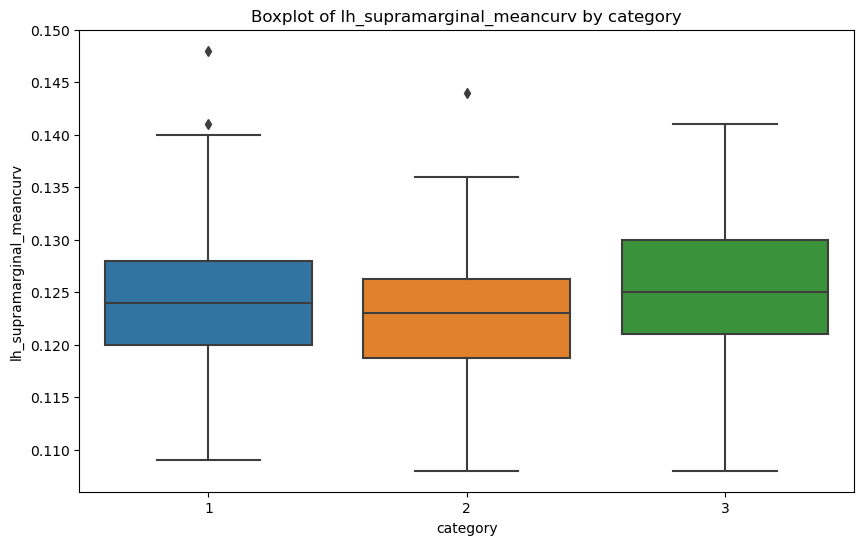

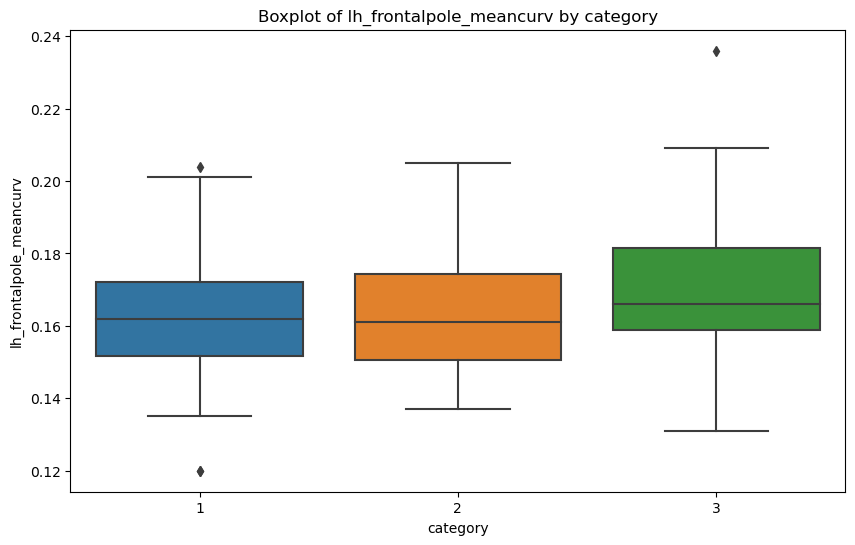

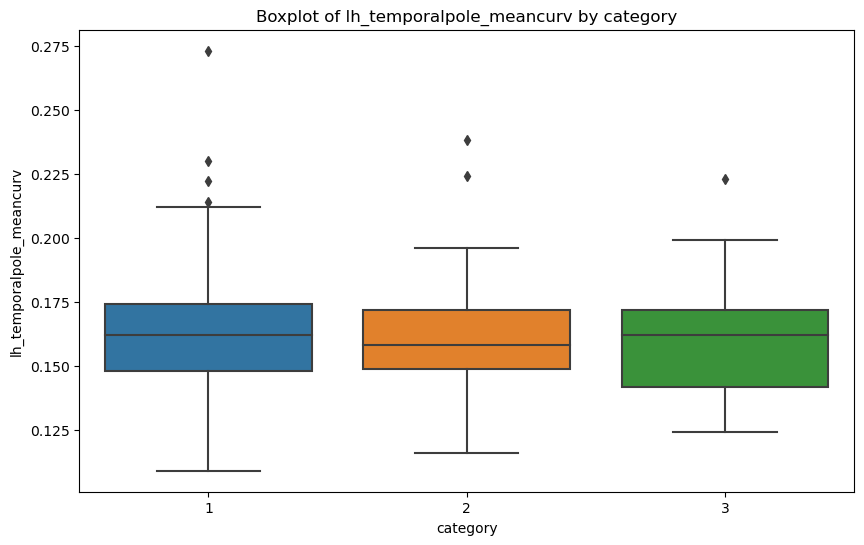

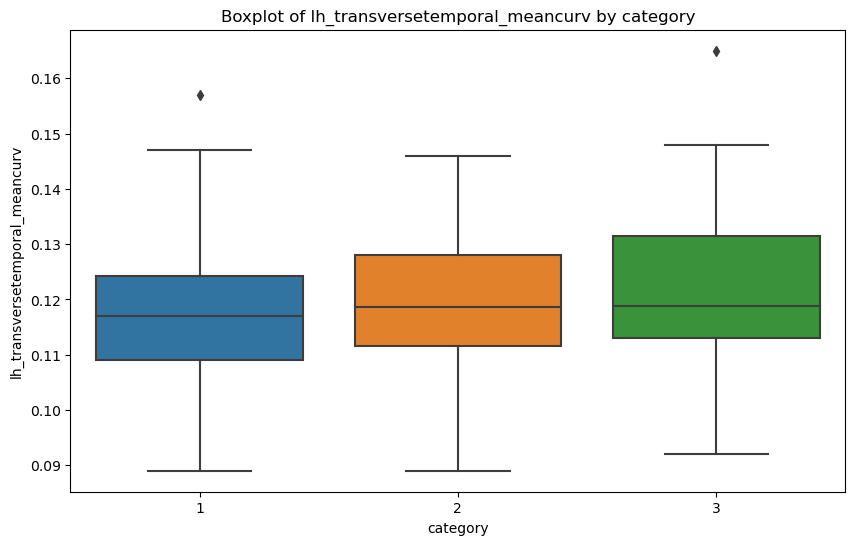

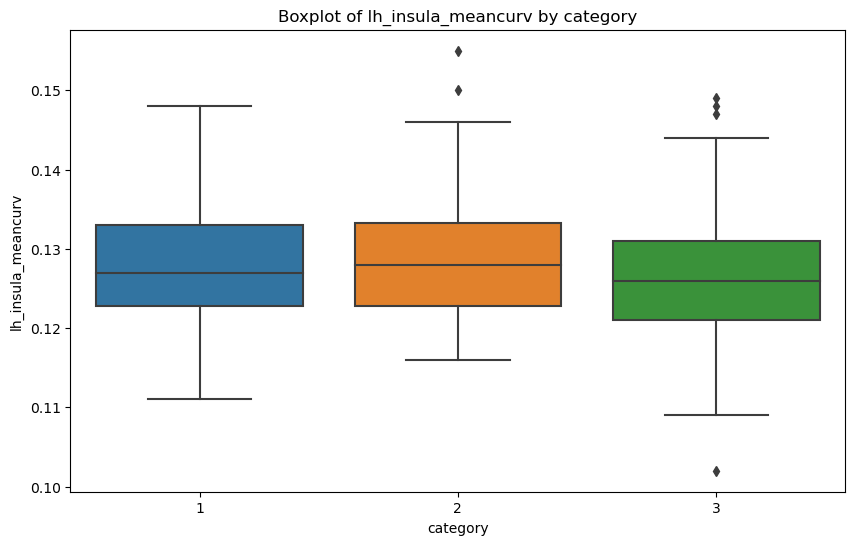

In [19]:
lh_aparc_meancurv['category'] = briefa['category']

correlation_matrix = lh_aparc_meancurv.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Correlation Heatmap of Features')
plt.show()

# Alternatively, scatter plots for each feature vs y (checkin_bin)
for feature in lh_aparc_meancurv.columns[:-1]:  # Exclude the label column
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='category', y=feature, data=lh_aparc_meancurv)
    plt.title(f'Boxplot of {feature} by category')
    plt.xlabel('category')
    plt.ylabel(feature)
    plt.show()


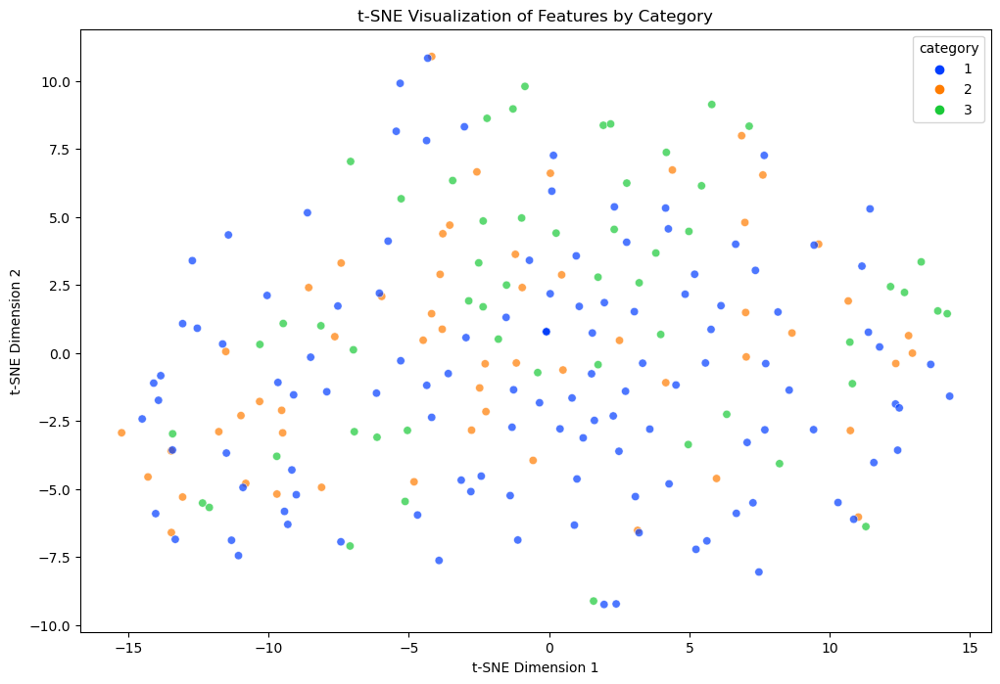

In [20]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Assuming bloodbiomk1 is your DataFrame and it's already preprocessed.
# Remove the 'category' column for t-SNE computation and then reattach for coloring the plot.
features = lh_aparc_meancurv.drop('category', axis=1)
categories = lh_aparc_meancurv['category']

# t-SNE transformation
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)  # adjust perplexity and iterations as needed
tsne_results = tsne.fit_transform(features)

# Prepare DataFrame for plotting
tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2'])
tsne_df['category'] = categories

# Plotting t-SNE results
plt.figure(figsize=(12, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='category', palette='bright', data=tsne_df, legend="full", alpha=0.7)
plt.title('t-SNE Visualization of Features by Category')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


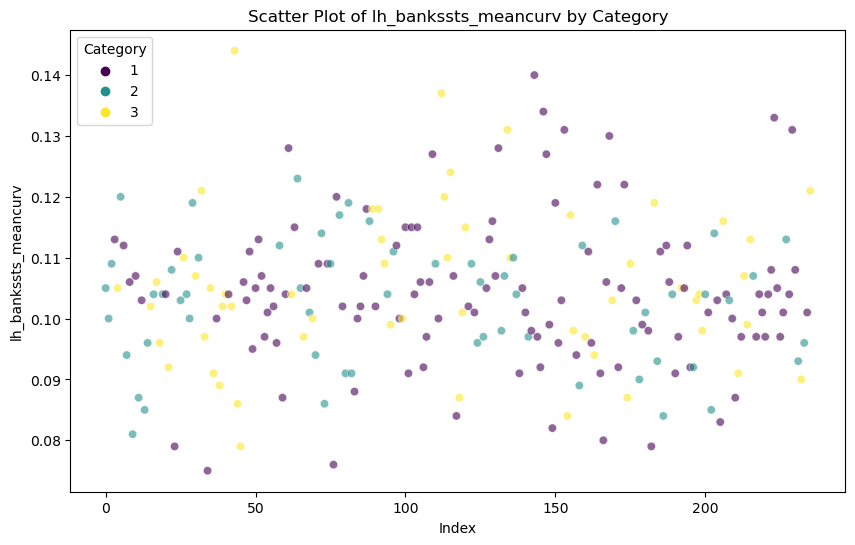

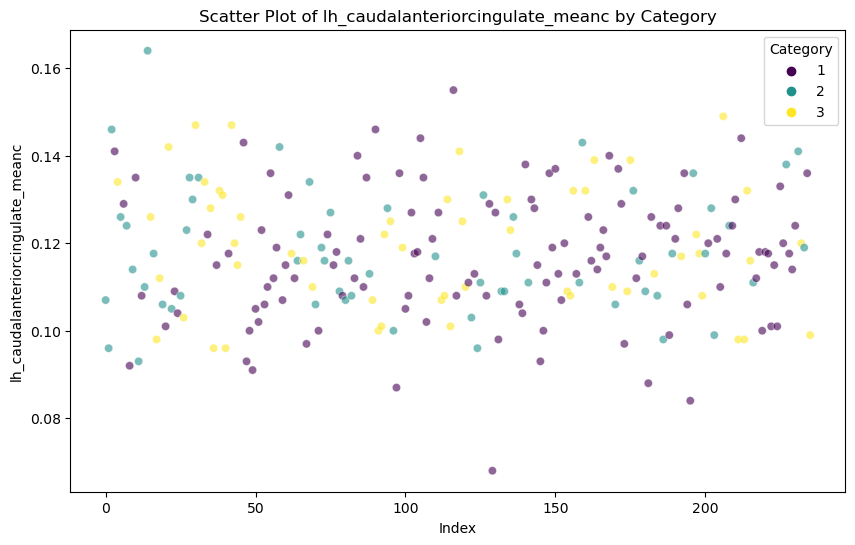

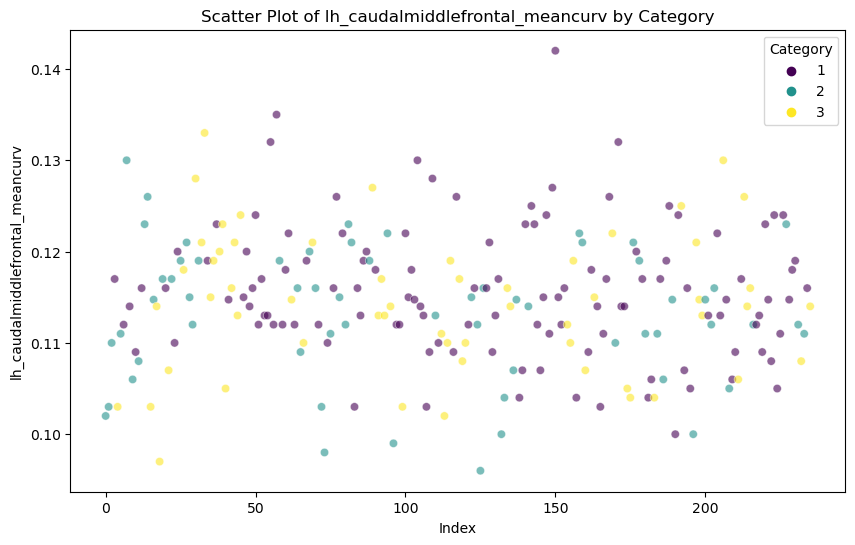

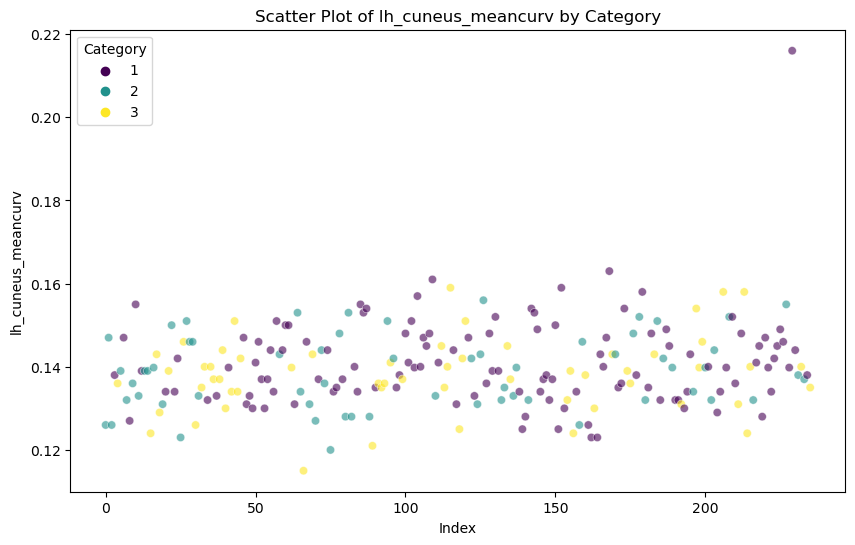

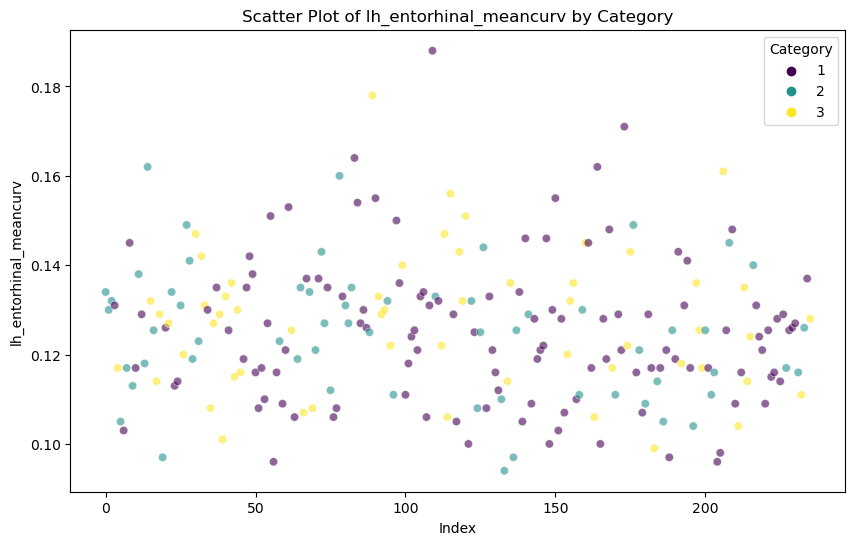

...

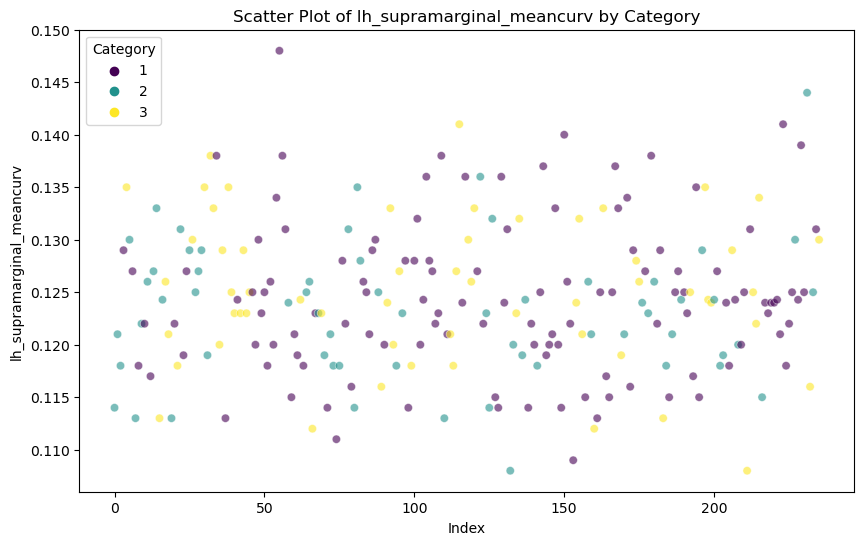

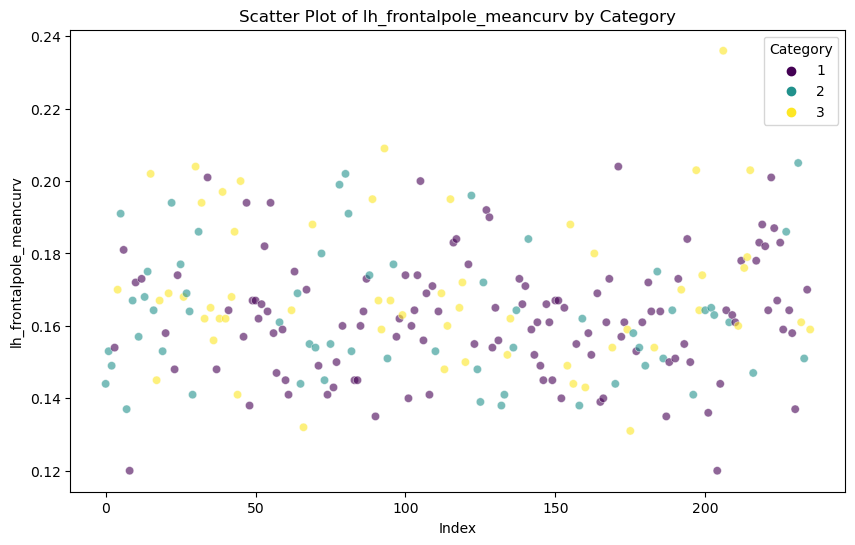

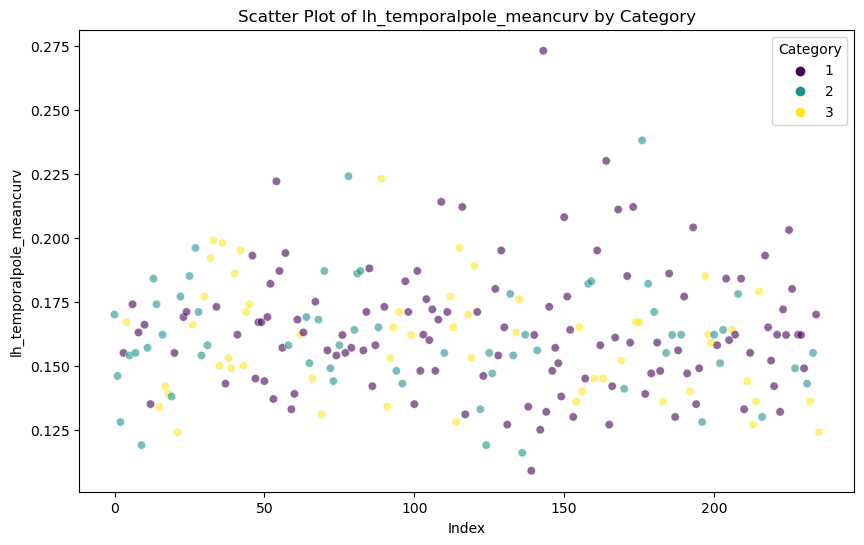

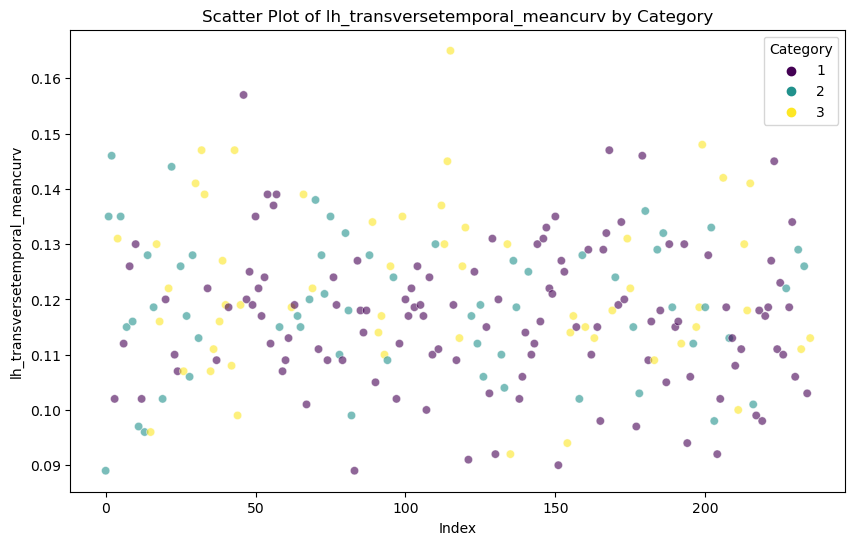

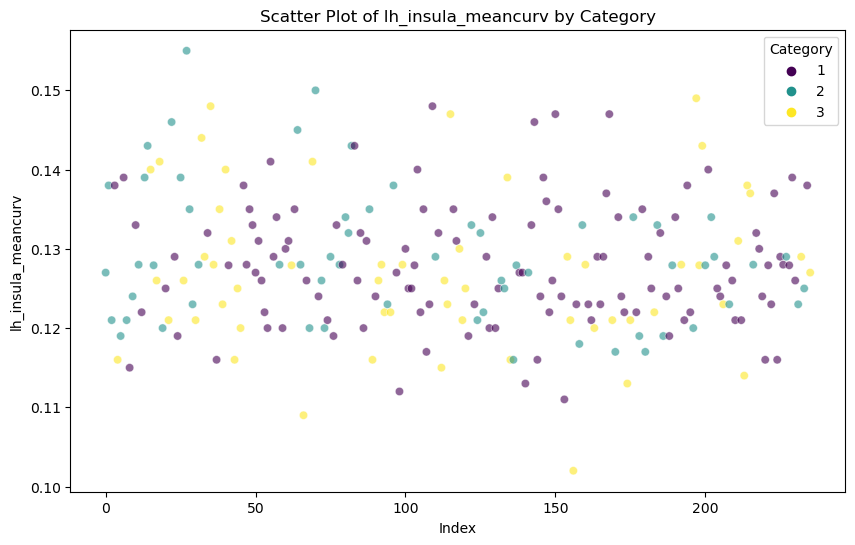

In [21]:
# Sactterplot
for feature in lh_aparc_meancurv.columns[:-1]:  # Exclude the label column
    plt.figure(figsize=(10, 6))
    # Use the 'category' column to color the data points based on the category
    sns.scatterplot(x=lh_aparc_meancurv.index, y=feature, hue='category', data=lh_aparc_meancurv, palette='viridis', alpha=0.6)
    plt.title(f'Scatter Plot of {feature} by Category')
    plt.xlabel('Index')
    plt.ylabel(feature)
    plt.legend(title='Category')
    plt.show()

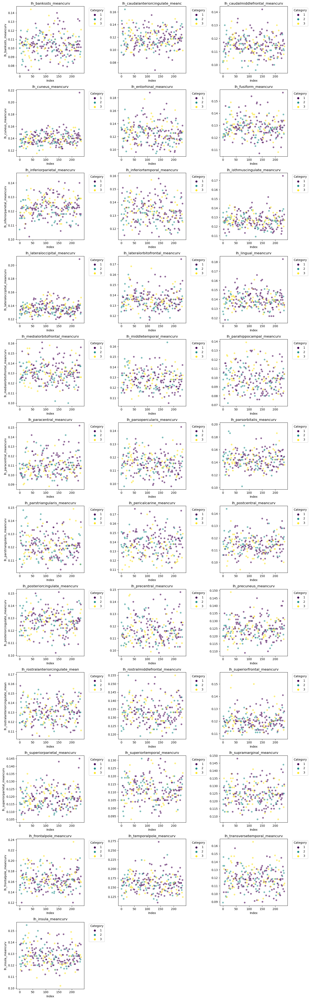

In [22]:
#Scatterplot as subplots

num_features = len(lh_aparc_meancurv.columns) - 1

cols = 3  
rows = (num_features + cols - 1) // cols  

plt.figure(figsize=(cols * 5, rows * 4))  # Adjust overall figure size

for i, feature in enumerate(lh_aparc_meancurv.columns[:-1]):  
    plt.subplot(rows, cols, i + 1)  
    sns.scatterplot(x=lh_aparc_meancurv.index, y=feature, hue='category', data=lh_aparc_meancurv, palette='viridis', alpha=0.6)
    plt.title(f'{feature}')
    plt.xlabel('Index')
    if i % cols == 0:  # Only set ylabel for the first column
        plt.ylabel(feature)
    else:
        plt.ylabel('')  # Remove y label for other columns to avoid clutter
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust legend position outside plot

plt.tight_layout()  # Adjust layout to make it neat
plt.show()



# 95th percentile for both analysis and plotting

In [23]:
for feature in lh_aparc_meancurv.columns[:-1]:  # Assuming 'category' is the last column
    upper_limit = lh_aparc_meancurv[feature].quantile(0.95)  # Cap at 95th percentile
    lower_limit = lh_aparc_meancurv[feature].quantile(0.05)  # Floor at 5th percentile
    lh_aparc_meancurv[feature] = np.where(lh_aparc_meancurv[feature] > upper_limit, upper_limit, lh_aparc_meancurv[feature])
    lh_aparc_meancurv[feature] = np.where(lh_aparc_meancurv[feature] < lower_limit, lower_limit, lh_aparc_meancurv[feature])

    

# Stop here and the n go to the initail steps for anlaysis

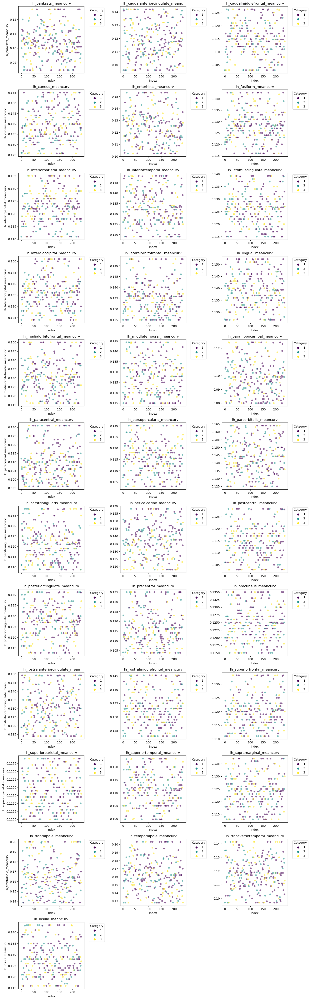

In [24]:
#Scatterplot as subplots

num_features = len(lh_aparc_meancurv.columns) - 1

cols = 3  
rows = (num_features + cols - 1) // cols  

plt.figure(figsize=(cols * 5, rows * 4))  # Adjust overall figure size

for i, feature in enumerate(lh_aparc_meancurv.columns[:-1]):  
    plt.subplot(rows, cols, i + 1)  
    sns.scatterplot(x=lh_aparc_meancurv.index, y=feature, hue='category', data=lh_aparc_meancurv, palette='viridis', alpha=0.6)
    plt.title(f'{feature}')
    plt.xlabel('Index')
    if i % cols == 0:  # Only set ylabel for the first column
        plt.ylabel(feature)
    else:
        plt.ylabel('')  # Remove y label for other columns to avoid clutter
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust legend position outside plot

plt.tight_layout()  # Adjust layout to make it neat
plt.show()


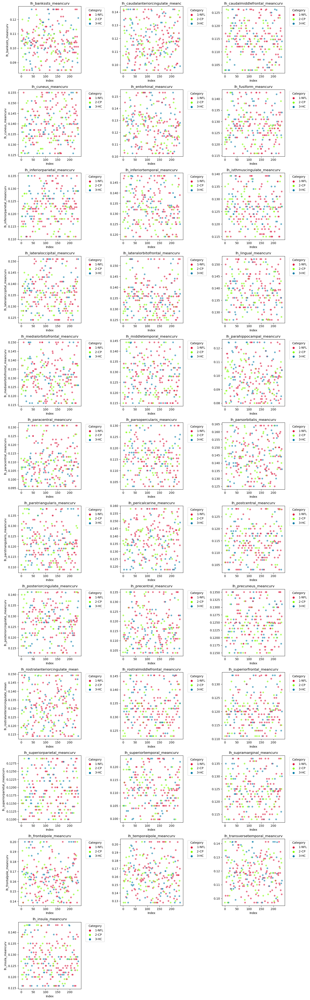

In [25]:
lh_aparc_meancurv['category_label'] = lh_aparc_meancurv['category'].map({1: '1-NFL', 2: '2-CP', 3: '3-HC'})
hue_order = ['1-NFL', '2-CP', '3-HC']

# Make a copy to reduce fragmentation
lh_aparc_meancurv = lh_aparc_meancurv.copy()

num_features = len(lh_aparc_meancurv.columns) - 2  # adjusting for category and category_label
cols = 3
rows = (num_features + cols - 1) // cols

plt.figure(figsize=(cols * 5, rows * 4))

for i, feature in enumerate(lh_aparc_meancurv.columns[:-2]):  # avoid category and category_label
    plt.subplot(rows, cols, i + 1)
    sns.scatterplot(x=lh_aparc_meancurv.index, y=feature, hue='category_label', data=lh_aparc_meancurv,
                    palette={'1-NFL': '#DC143C', '2-CP': '#7FFF00', '3-HC': '#007BA7'}, alpha=0.6,hue_order=hue_order)
    plt.title(f'{feature}')
    plt.xlabel('Index')
    if i % cols == 0:
        plt.ylabel(feature)
    else:
        plt.ylabel('')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

C:\Users\fargor\AppData\Local\Temp\ipykernel_18980\3624144192.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


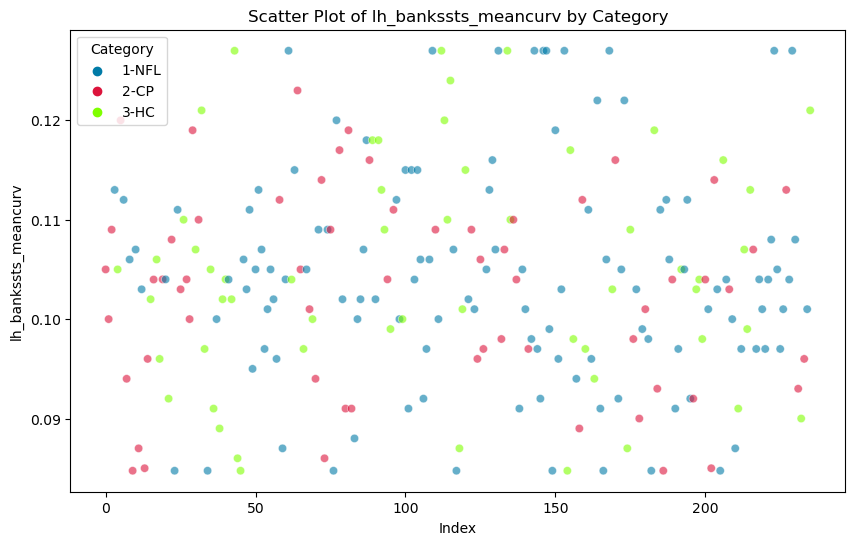

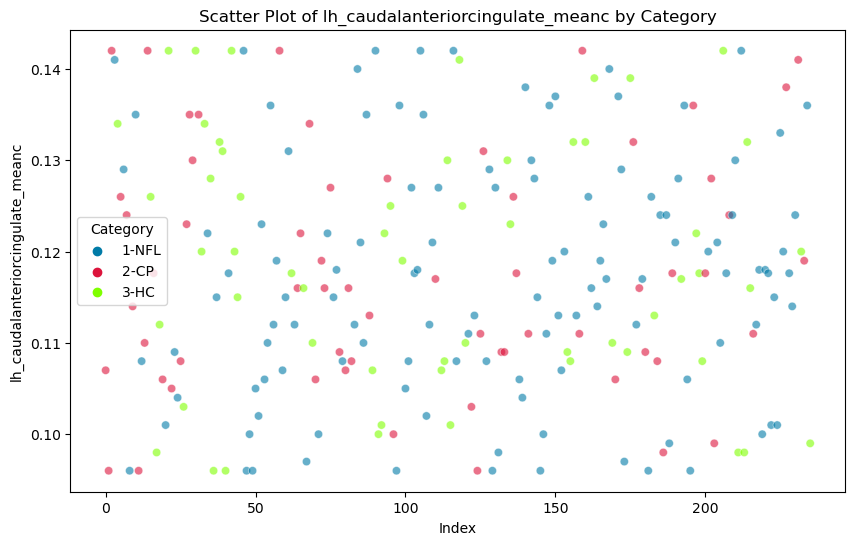

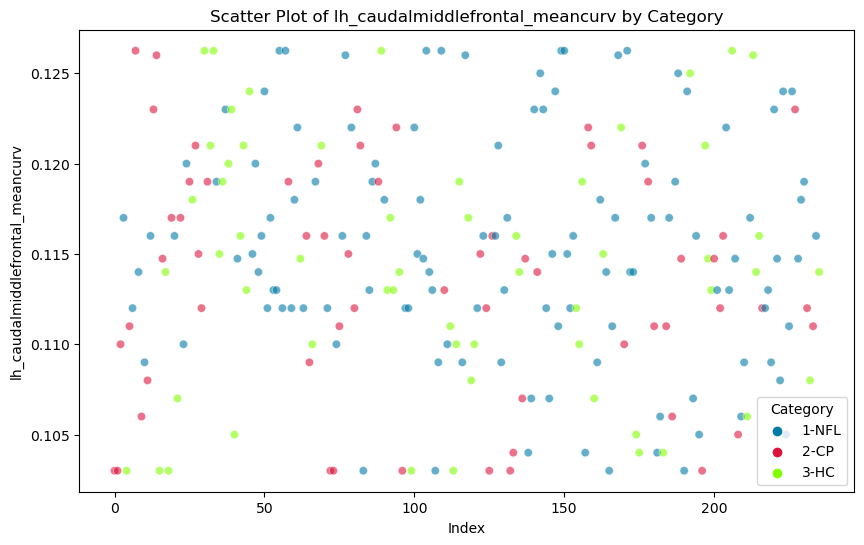

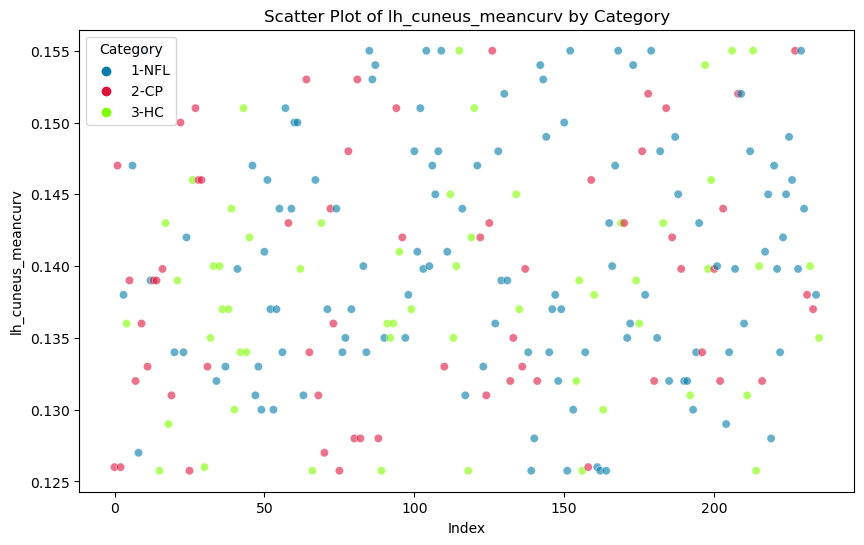

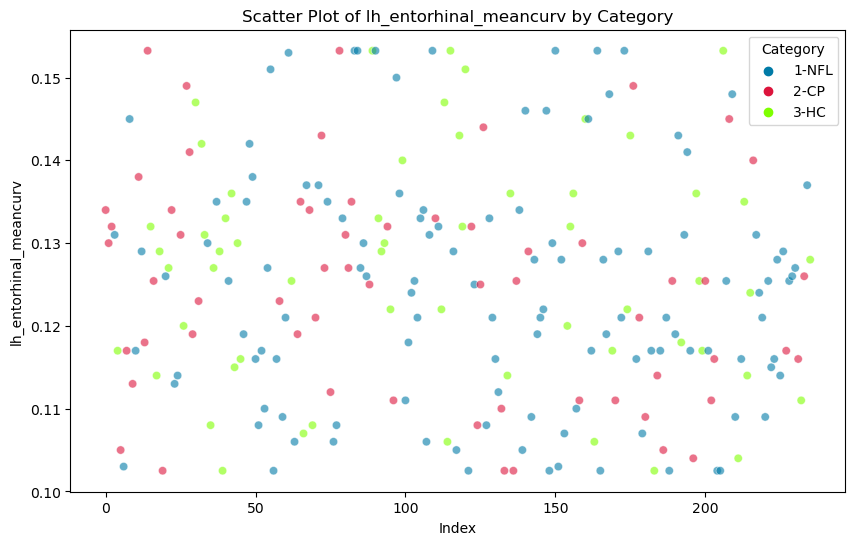

...

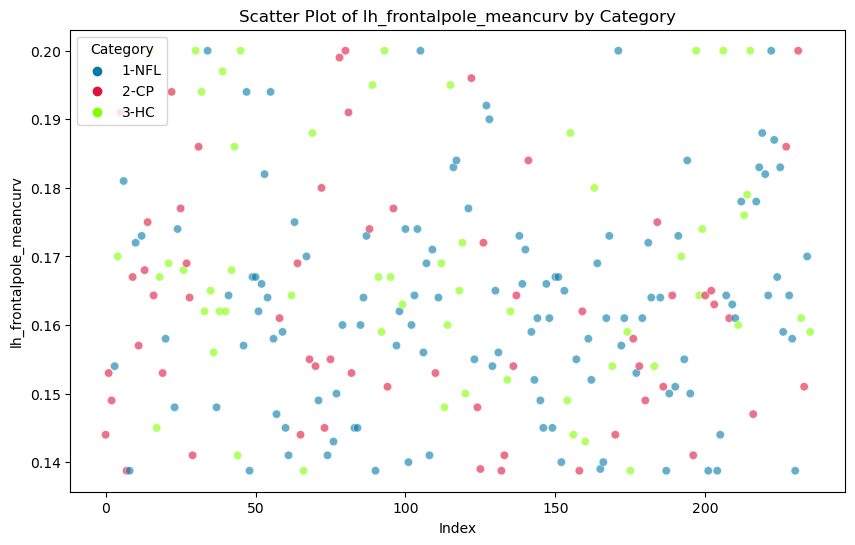

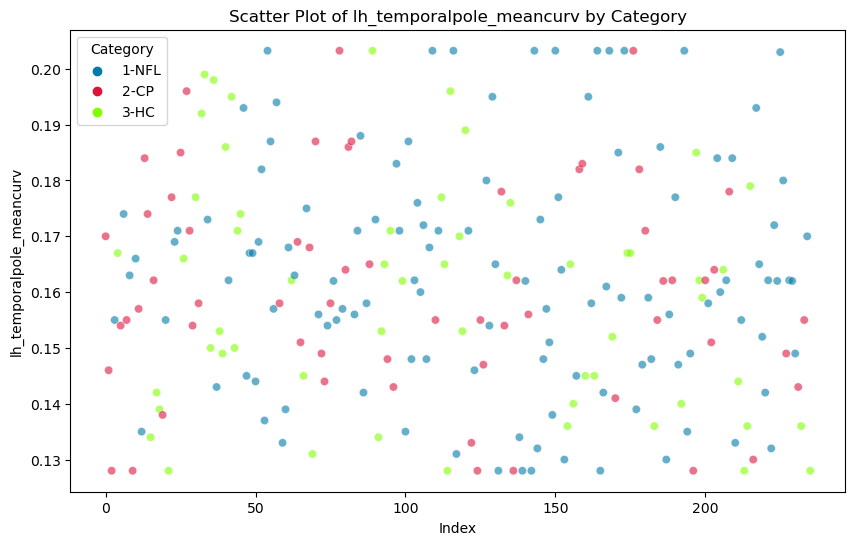

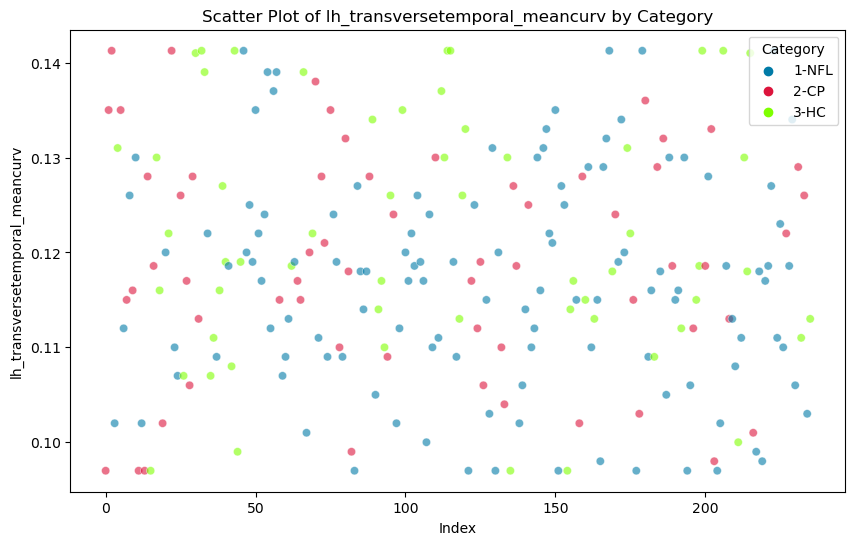

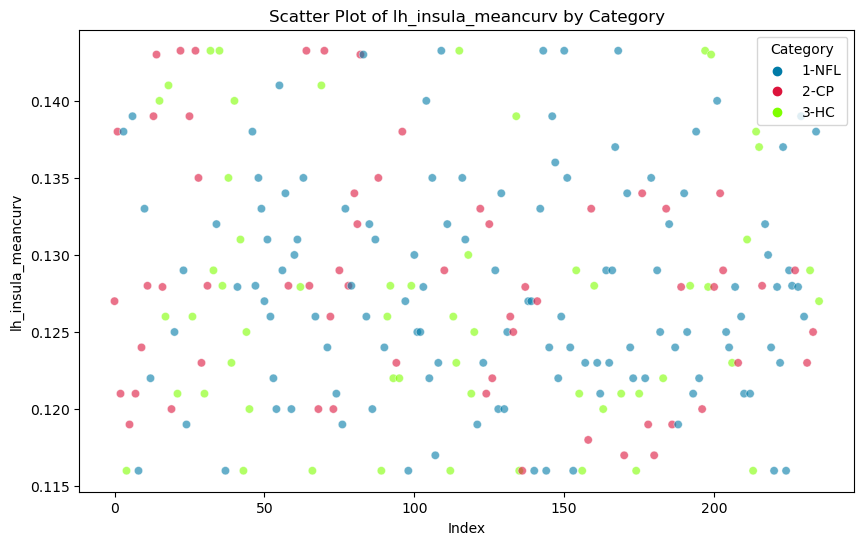

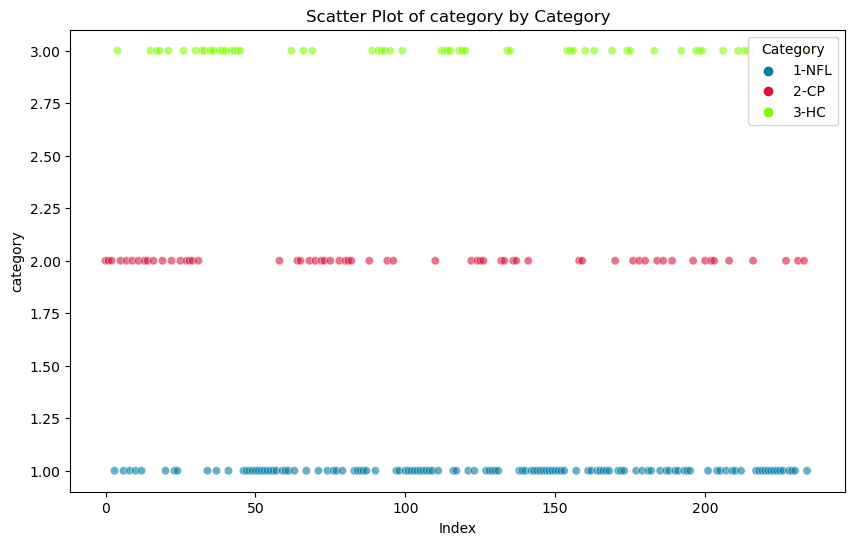

In [26]:
# Custom color palette and order
custom_palette = {'1-NFL': '#007BA7', '2-CP': '#DC143C', '3-HC': '#7FFF00'}
hue_order = ['1-NFL', '2-CP', '3-HC']

# Loop through each feature to create and save plots
for i, feature in enumerate(lh_aparc_meancurv.columns[:-1]):  # Assuming the last column is 'category_label'
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=lh_aparc_meancurv.index, y=feature, hue='category_label', data=lh_aparc_meancurv,
                    palette=custom_palette, alpha=0.6, hue_order=hue_order)
    plt.title(f'Scatter Plot of {feature} by Category')
    plt.xlabel('Index')
    plt.ylabel(feature)
    plt.legend(title='Category')

    # Specify the filename for each plot
    filename = f"{feature}_distribution_by_category.png"
    file_path = f"{save_path}/{filename}"  # Construct the full file path

    plt.savefig(file_path)
#     plt.close()  

In [27]:
num_features = len(lh_aparc_meancurv.columns) - 1
cols = 3
rows = 3  # Fixed to 3x3 grid per figure
num_plots_per_figure = cols * rows

# Loop through features and create subplots in batches of 9
for i in range(0, num_features, num_plots_per_figure):
    plt.figure(figsize=(15, 10))  # Increase overall figure size for better visibility
    for j in range(num_plots_per_figure):
        if i + j < num_features:  # Check if the feature index exists
            plt.subplot(rows, cols, j + 1)
            feature = lh_aparc_meancurv.columns[i + j]
            sns.scatterplot(x=lh_aparc_meancurv.index, y=feature, hue='category_label', data=lh_aparc_meancurv,
                            palette=custom_palette, alpha=0.6, hue_order=hue_order, s=50)
            plt.title(f'{feature}', fontsize=10)  # Adjust subplot title size
            plt.xlabel('', fontsize=9)  # Adjust subplot x-axis label size
            plt.ylabel(feature, fontsize=9)  # Adjust subplot y-axis label size
            plt.legend(title='Category', title_fontsize='9', fontsize='8', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust subplot legend size

    # Save each figure
    figure_filename = f"lh_aparc_meancurv_grid_{i // num_plots_per_figure + 1}.png"
    figure_path = f"{save_path}/{figure_filename}"
    plt.savefig(figure_path, dpi=300)  # High resolution
    plt.close()



In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

num_features = len(lh_aparc_meancurv.columns) - 1
cols = 3
rows = 3  # Fixed to 3x3 grid per figure
num_plots_per_figure = cols * rows

# Loop through features and create subplots in batches of 9
for i in range(0, num_features, num_plots_per_figure):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 10))  # Use subplots to manage the grid and axes
    axes = axes.flatten()  # Flatten the axes array for easier iteration

    for j in range(num_plots_per_figure):
        ax = axes[j]  # Current axis
        if i + j < num_features:  # Check if the feature index exists
            feature = lh_aparc_meancurv.columns[i + j]
            sns.scatterplot(x=lh_aparc_meancurv.index, y=feature, hue='category_label', data=lh_aparc_meancurv,
                            palette=custom_palette, alpha=0.6, hue_order=hue_order, s=50, ax=ax)
            ax.set_title(f'{feature}', fontsize=10)  # Adjust subplot title size
            ax.set_xlabel('', fontsize=9)  # Adjust subplot x-axis label size
            ax.set_ylabel(feature, fontsize=9)  # Adjust subplot y-axis label size
            ax.legend_.remove()  # Remove individual subplot legends
        else:
            fig.delaxes(ax)  # Remove unused axes if the number of plots is less than the grid size

    # Create a single shared legend
    handles, labels = ax.get_legend_handles_labels()  # Get legend handles and labels from the last used axis
    fig.legend(handles, labels, title='Category', title_fontsize='9', fontsize='8', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()  # Adjust layout to make it neat
    # Save each figure
    figure_filename = f"lh_aparc_meancurv_grid_{i // num_plots_per_figure + 1}.png"
    figure_path = f"{save_path}/{figure_filename}"
    plt.savefig(figure_path, dpi=300, bbox_inches='tight')  # High resolution and adjust bounding box to include legend
    plt.close()


In [29]:
# # got error due to non numeric values, so removing them:

# import pandas as pd
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler

# # Assume bloodbiomk1 is your DataFrame loaded with various types of data
# X = bloodbiomk1.copy()

# # Select only numeric columns from the DataFrame
# X_numeric = X.select_dtypes(include=[np.number])
# X = X_numeric

# # Now X_numeric contains only the numeric columns of the original DataFrame
# # Proceed with scaling
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# # Split into training and testing sets
# X_train, X_test = train_test_split(X_scaled, test_size=0.3, random_state=42)


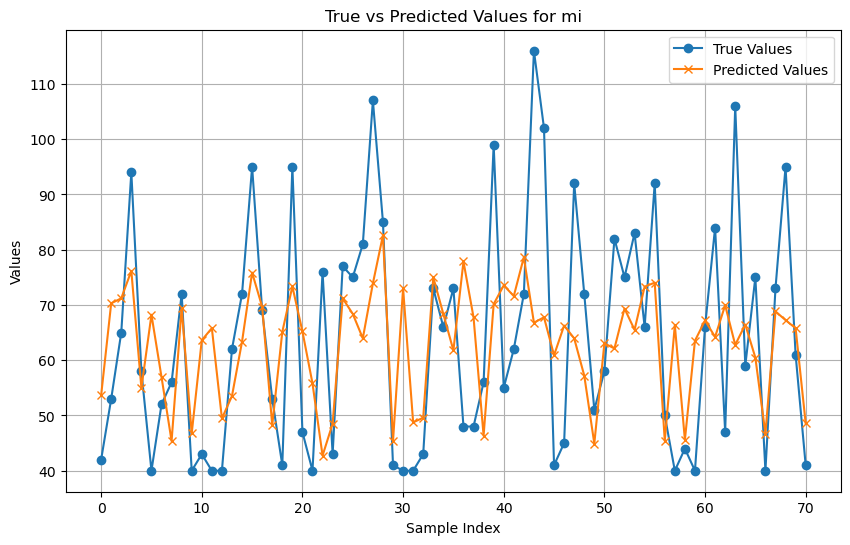

Column: mi, Mean Squared Error: 333.1420434878346, Mean Absolute Error: 14.711106695729935, R²: 0.21071970810934215


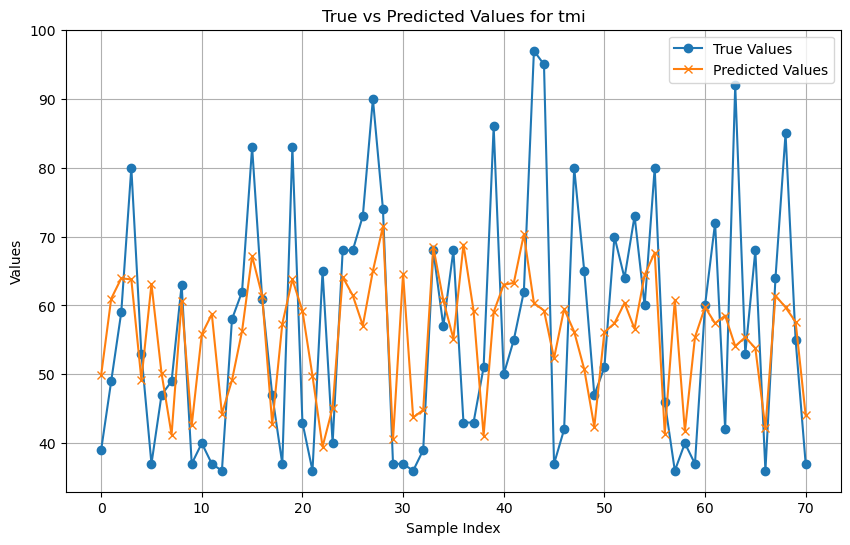

Column: tmi, Mean Squared Error: 238.45322230987, Mean Absolute Error: 12.388189861390565, R²: 0.19902374079672658


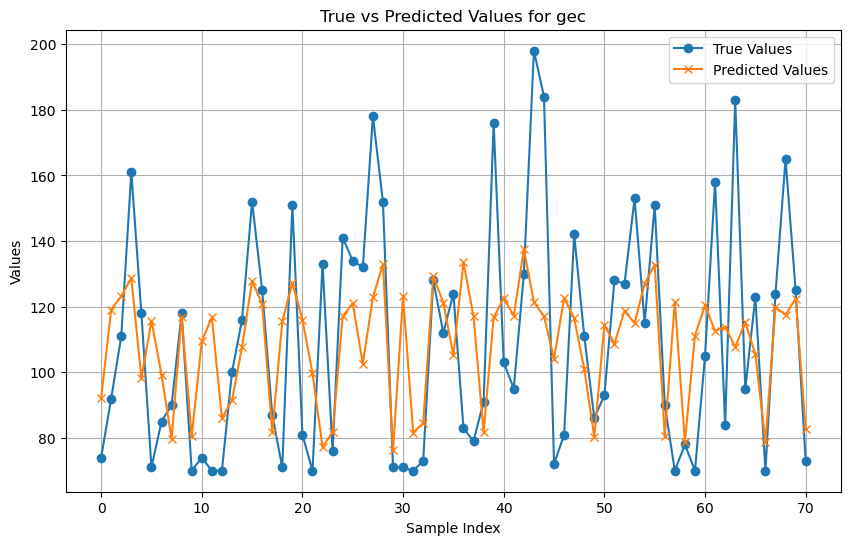

Column: gec, Mean Squared Error: 951.0258030759555, Mean Absolute Error: 24.583017102615695, R²: 0.21756100743316353


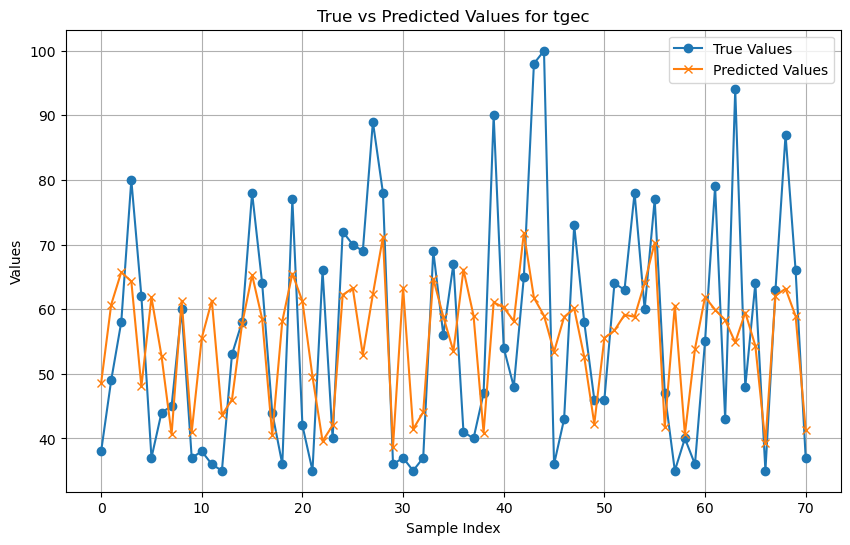

Column: tgec, Mean Squared Error: 243.40443320601383, Mean Absolute Error: 12.471547283702215, R²: 0.24157466195942


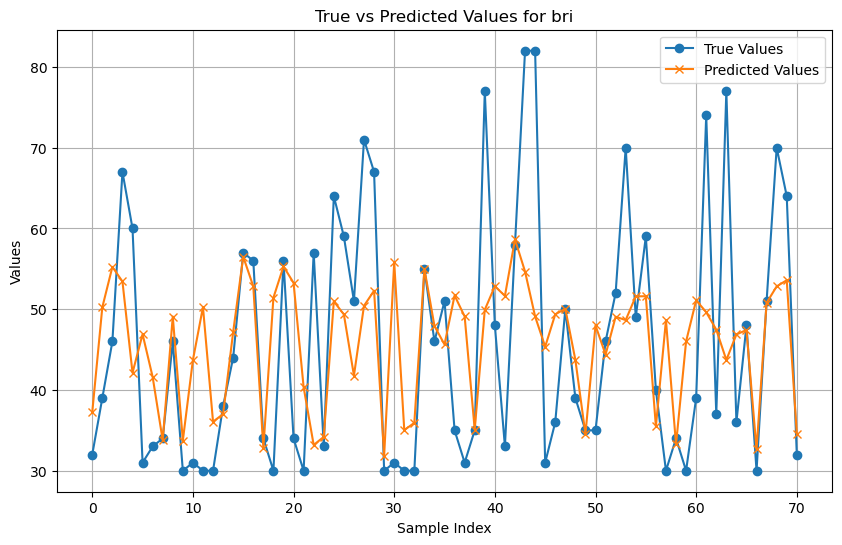

Column: bri, Mean Squared Error: 178.7747333970001, Mean Absolute Error: 10.119212791902934, R²: 0.22466319516846434


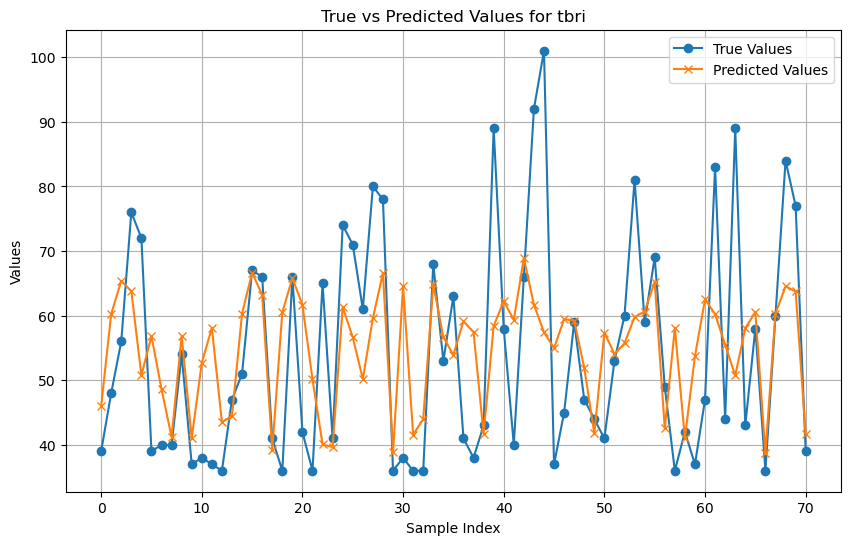

Column: tbri, Mean Squared Error: 225.74569711382833, Mean Absolute Error: 11.524223797329432, R²: 0.22804995146359952


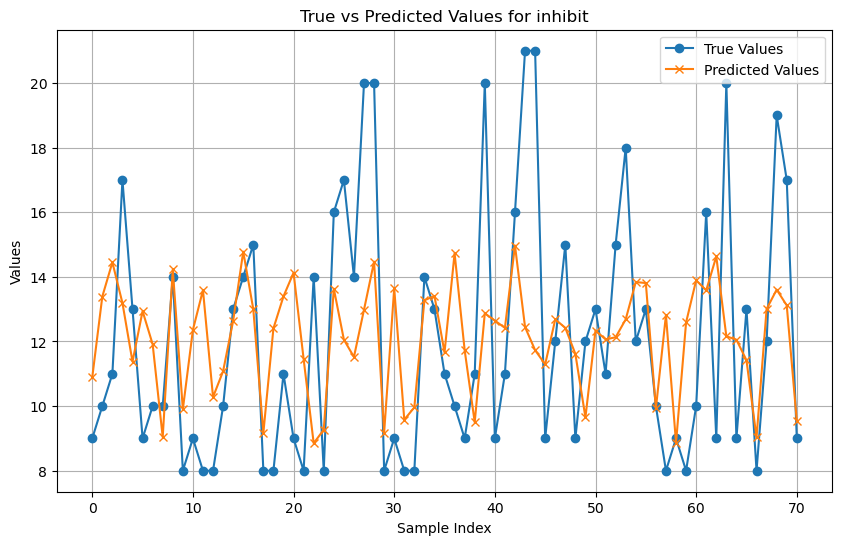

Column: inhibit, Mean Squared Error: 12.7180004689546, Mean Absolute Error: 2.873552146210597, R²: 0.1298900631904657


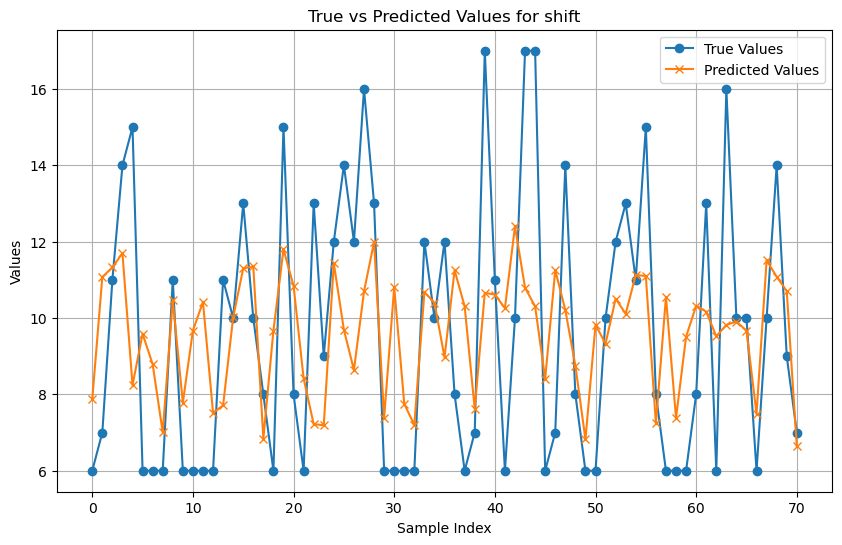

Column: shift, Mean Squared Error: 9.802700678216123, Mean Absolute Error: 2.580302816901409, R²: 0.1934810817873761


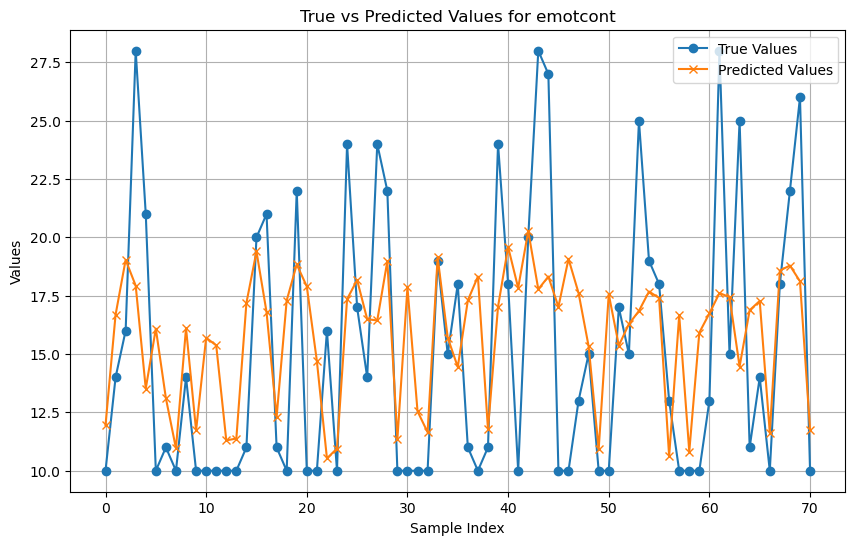

Column: emotcont, Mean Squared Error: 26.299839921999375, Mean Absolute Error: 4.127352112676055, R²: 0.2046845610217347


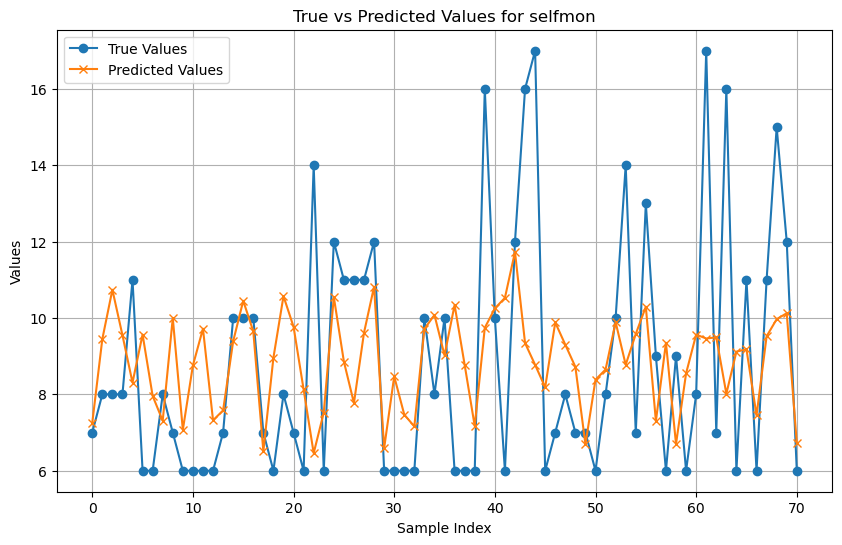

Column: selfmon, Mean Squared Error: 9.296857357033371, Mean Absolute Error: 2.3752272930512364, R²: 0.06586689382489086


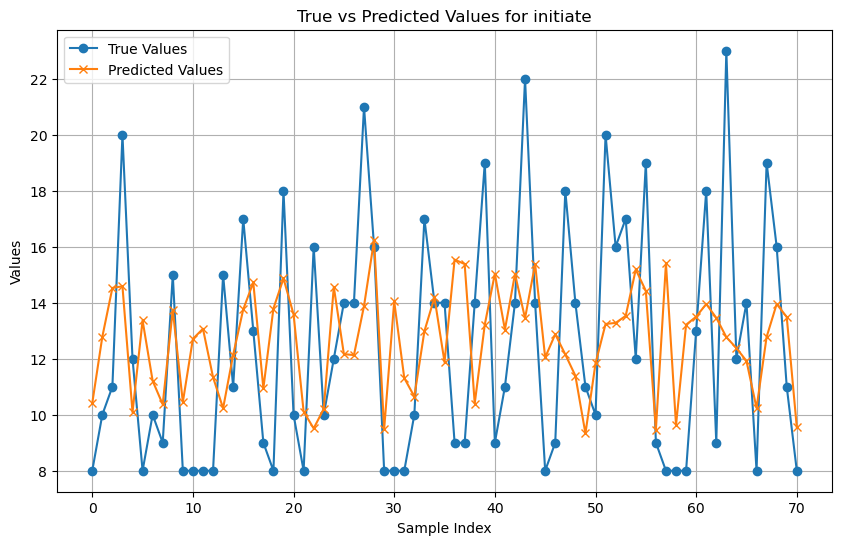

Column: initiate, Mean Squared Error: 16.13102015608512, Mean Absolute Error: 3.3701756752637038, R²: 0.07462420503419565


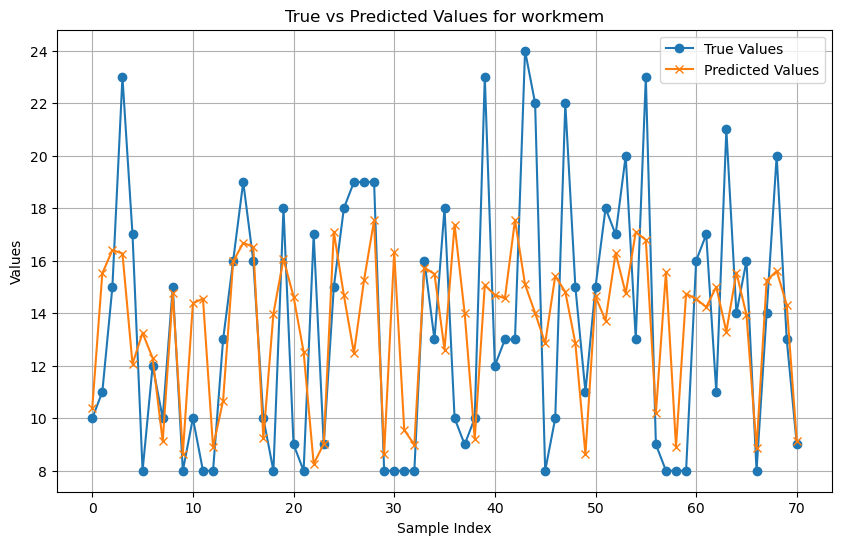

Column: workmem, Mean Squared Error: 18.300100139647412, Mean Absolute Error: 3.383787391012744, R²: 0.20029469811745726


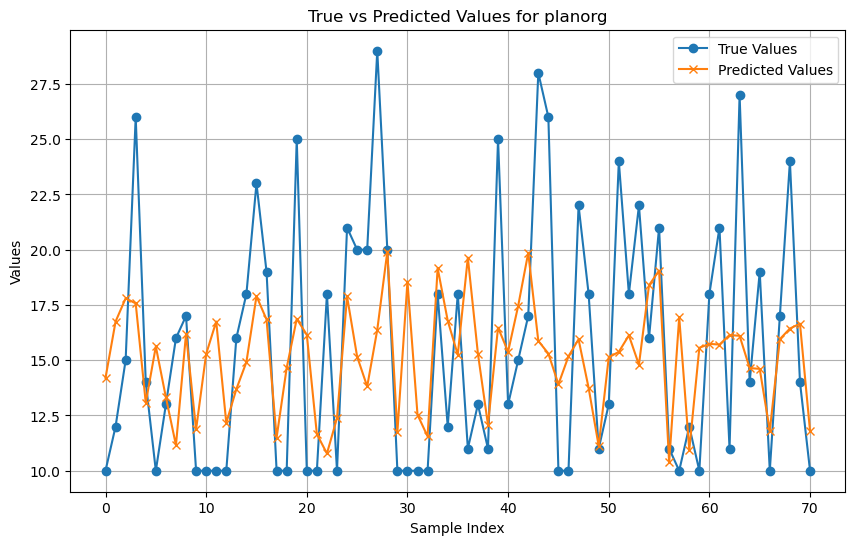

Column: planorg, Mean Squared Error: 26.277225342643383, Mean Absolute Error: 4.162159233176839, R²: 0.14726733003562964


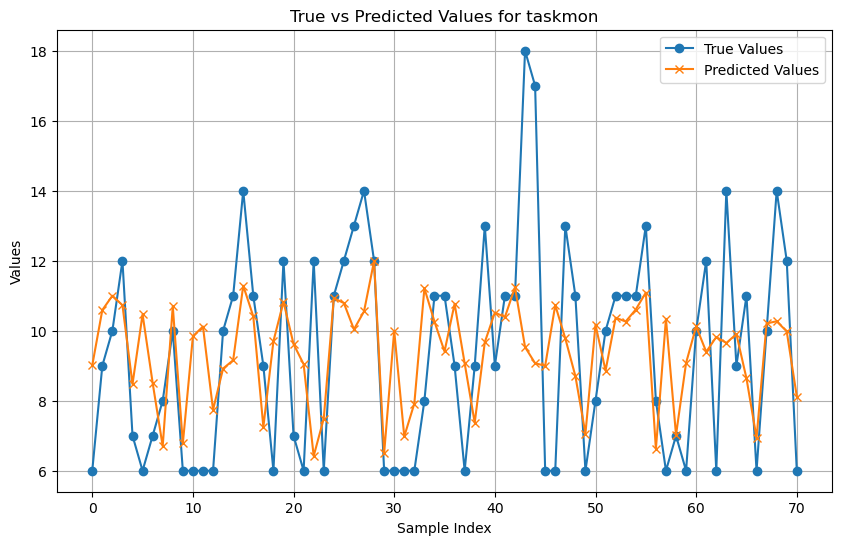

Column: taskmon, Mean Squared Error: 7.539778511976623, Mean Absolute Error: 2.1814647887323937, R²: 0.15627722698290347


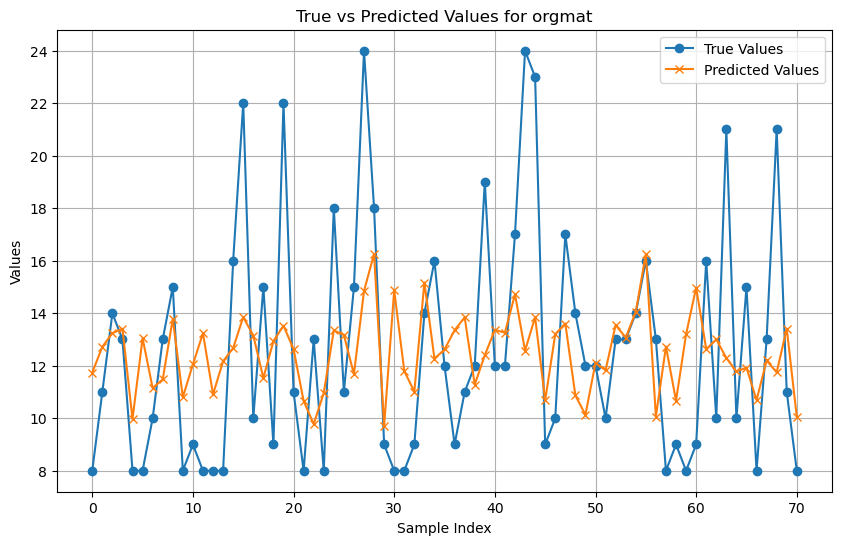

Column: orgmat, Mean Squared Error: 16.743904895444096, Mean Absolute Error: 3.2454879275653927, R²: 0.13774619901998475


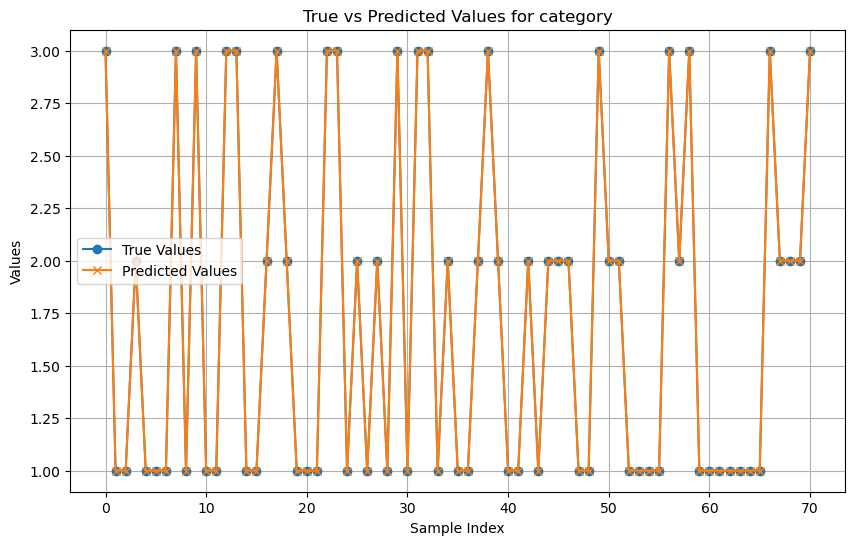

Column: category, Mean Squared Error: 0.0, Mean Absolute Error: 0.0, R²: 1.0


In [30]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

models = {}
predictions = {}

for column in briefa.columns:
    y = briefa[column]  
    X = lh_aparc_meancurv
    X = X.select_dtypes(include=[np.number])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)  
    X_test_scaled = scaler.transform(X_test) 
    
    
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train_scaled, y_train)

    models[column] = model

    y_pred = model.predict(X_test_scaled)
    predictions[column] = y_pred

    plt.figure(figsize=(10, 6))
    plt.plot(y_test.reset_index(drop=True), label='True Values', marker='o')
    plt.plot(y_pred, label='Predicted Values', marker='x')
    plt.title(f'True vs Predicted Values for {column}')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.legend()
    plt.grid()
    
    file_name = f"{column}_true_vs_predicted.png"  
#     plt.savefig(os.path.join(save_path, file_name), bbox_inches='tight')  
    plt.show()

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Column: {column}, Mean Squared Error: {mse}, Mean Absolute Error: {mae}, R²: {r2}")

# Initial Step for Trainings

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# got error due to non numeric values, so removing them:

# Assume bloodbiomk1 is your DataFrame loaded with various types of data
X = lh_aparc_meancurv.copy()

# Select only numeric columns from the DataFrame
X_numeric = X.select_dtypes(include=[np.number])
X = X_numeric

# Now X_numeric contains only the numeric columns of the original DataFrame
# Proceed with scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split into training and testing sets
X_train, X_test = train_test_split(X_scaled, test_size=0.3, random_state=42)


models = {}
predictions = {}


X_train, X_test = train_test_split(X_scaled, test_size=0.3, random_state=42)

In [32]:
# Define the columns you want to select for modeling
## columns = ['mi', 'tmi','gec','tgec','bri','tbri','inhibit','shift','emotcont','selfmon','initiate','workmem','planorg','taskmon','orgmat'] 
# selected_columns = ['mi']  # Replace 'column1' and 'column2' with the actual column names

selected_columns = ['mi', 'tmi','gec','tgec','bri','tbri','inhibit','shift','emotcont','selfmon','initiate','workmem','planorg','taskmon','orgmat']  # Replace 'column1' and 'column2' with the actual column names


In [33]:
selected_columns

['mi',
 'tmi',
 'gec',
 'tgec',
 'bri',
 'tbri',
 'inhibit',
 'shift',
 'emotcont',
 'selfmon',
 'initiate',
 'workmem',
 'planorg',
 'taskmon',
 'orgmat']

# Bringing Categories and setting color

In [34]:
custom_palette = {1: '#007BA7', 2: '#DC143C', 3: '#7FFF00'}
hue_order = ['1-NFL', '2-CP', '3-HC']

In [35]:
categories_file_path = r"Z:\Active-Diagnose_CTE\Fargol_Analysis\Neuropsychiatric_from_Volumes\categories.csv"
categories_df = pd.read_csv(categories_file_path)
new_column = categories_df['checkin_bin']
briefa['category'] = new_column
print(briefa.head())

    mi  tmi  gec  tgec  bri  tbri  inhibit  shift  emotcont  selfmon  \
0   75   64  114    57   39    46       12      9        11        7   
1  101   85  171    85   70    79       17     15        23       15   
2   90   77  158    79   68    77       15     14        27       12   
3   43   40   81    42   38    46        9      8        15        6   
4   43   39   81    41   38    45        9     11        12        6   

   initiate  workmem  planorg  taskmon  orgmat  category  
0        14       17       20       13      11         2  
1        19       24       27       15      16         2  
2        20       22       22       14      12         2  
3         9        8       11        7       8         1  
4        10        8       10        7       8         3  


# Bar plots based on category

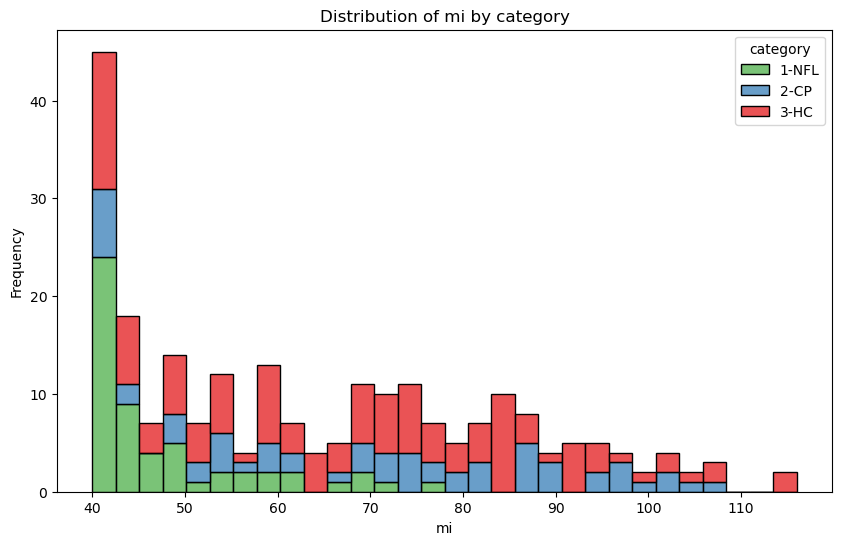

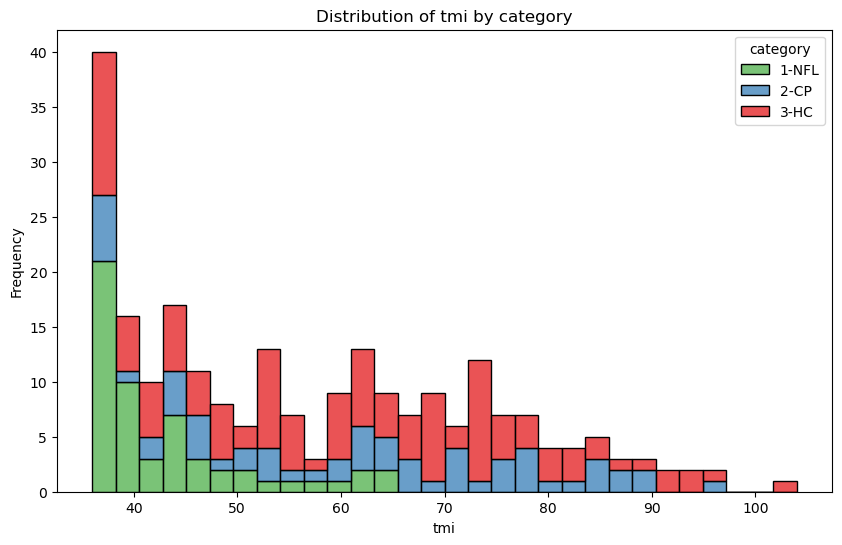

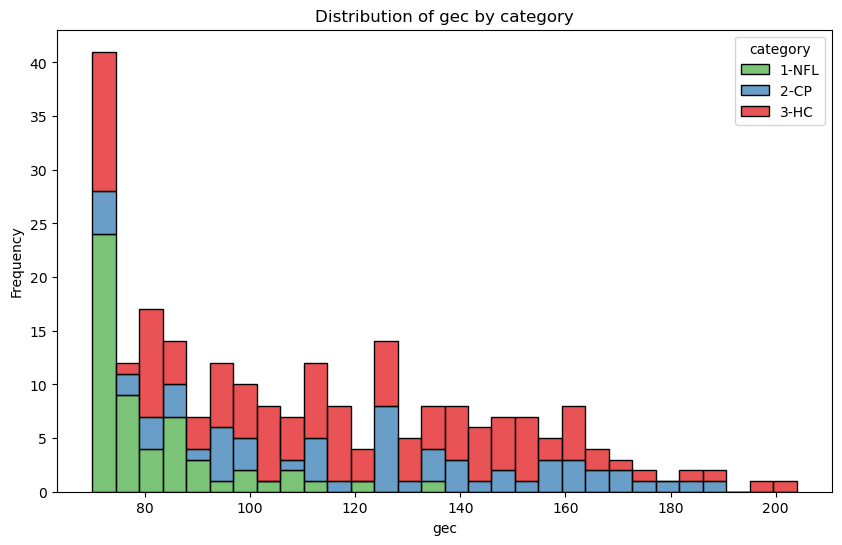

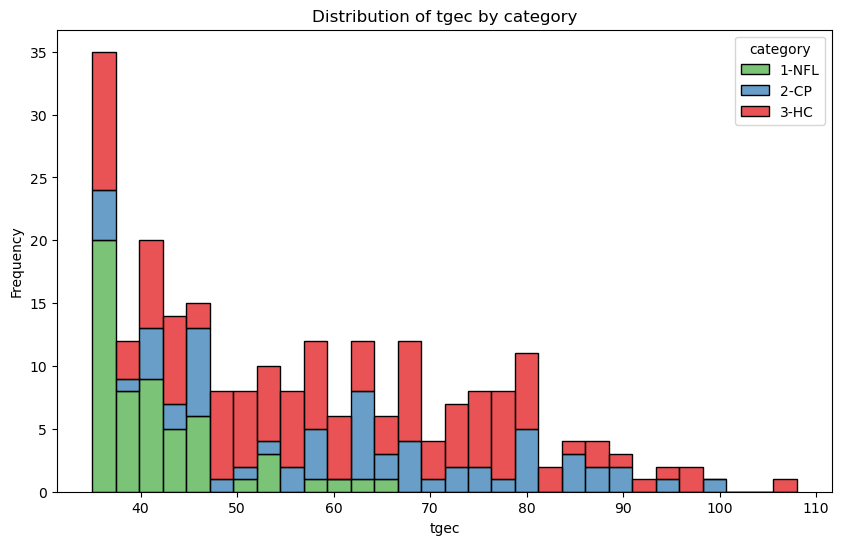

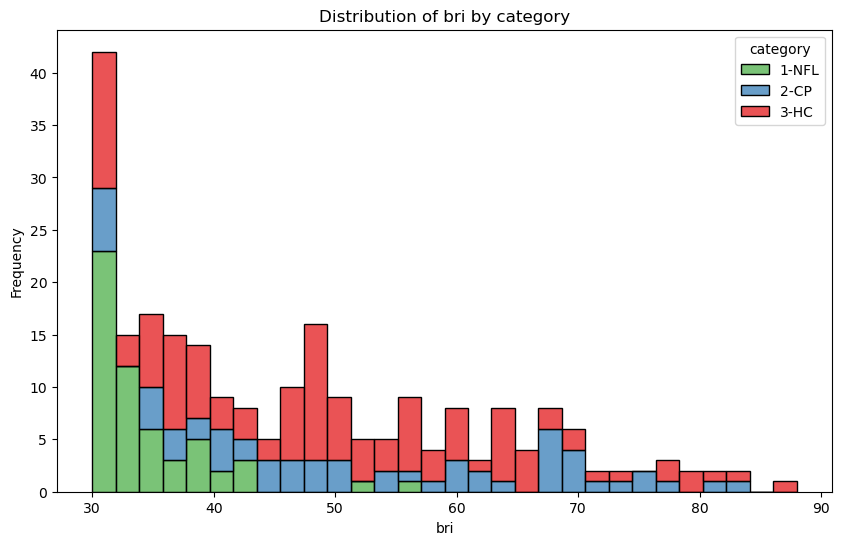

...

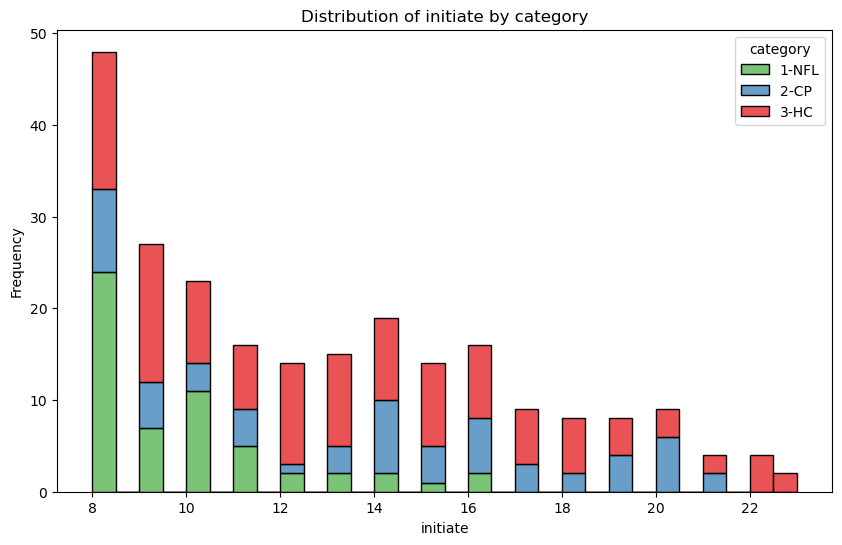

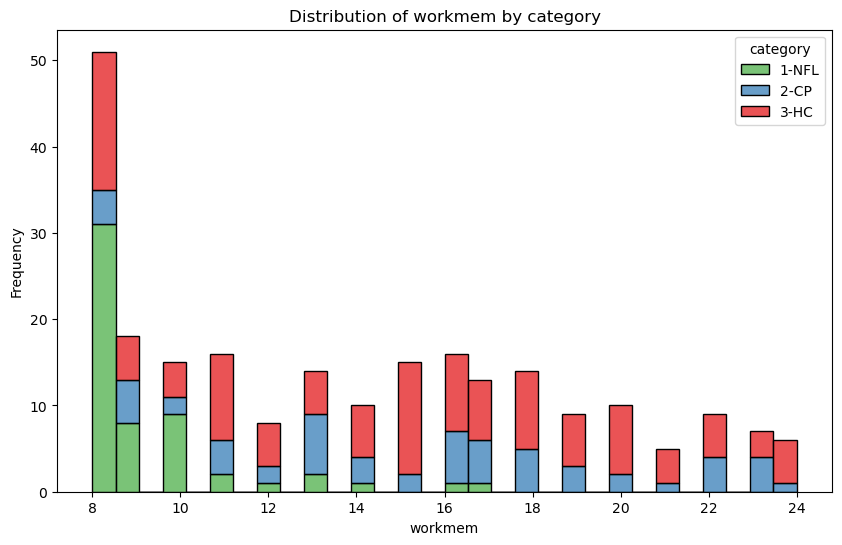

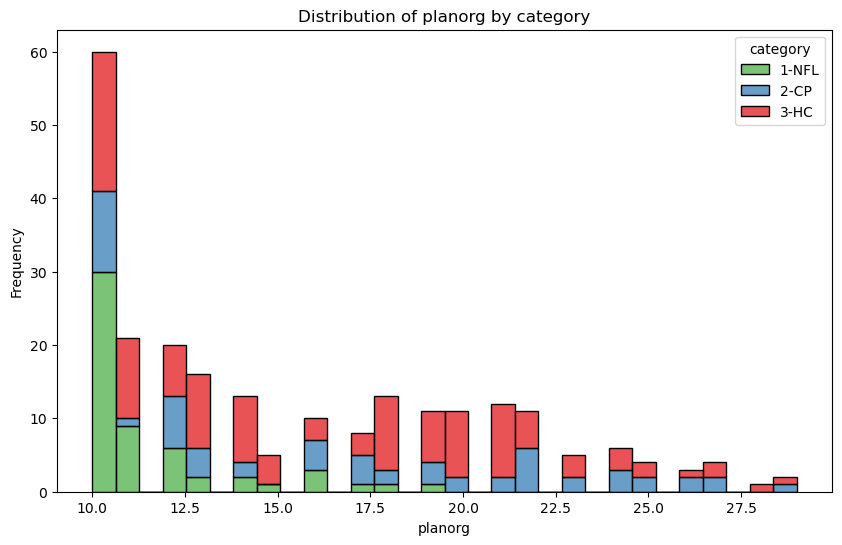

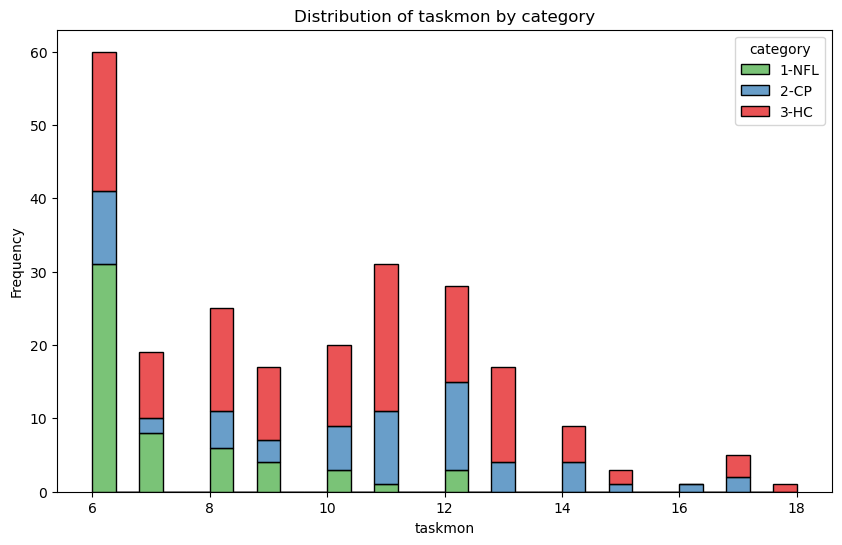

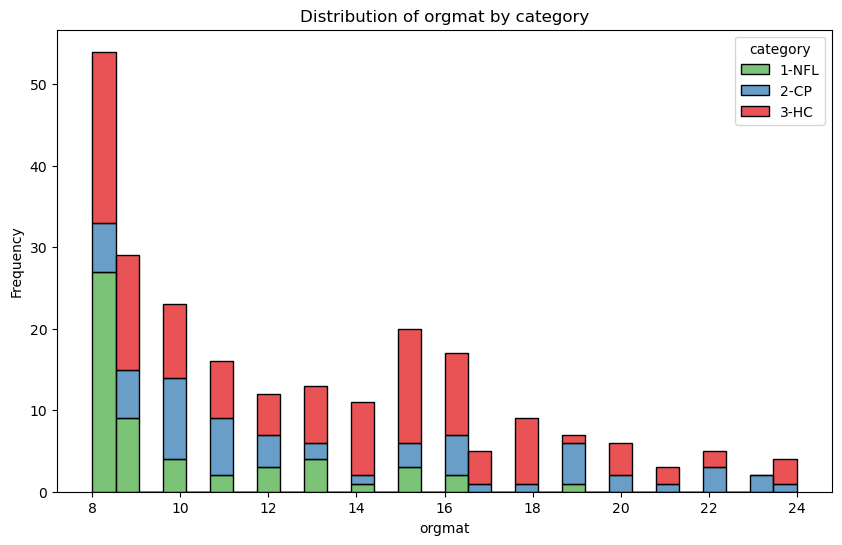

In [36]:
category_col = 'category'
column = selected_columns

# Define the full path for saving the figure
filename = f"{column}_distribution.png"
full_path = f"{save_path}/{filename}"
        

for column in selected_columns:
    if column != category_col:
        plt.figure(figsize=(10, 6))
        sns.histplot(data=briefa, x=column, hue=category_col, palette='Set1', multiple='stack', bins=30)
        plt.legend(title=category_col, labels=['1-NFL', '2-CP', '3-HC'])
        plt.title(f'Distribution of {column} by {category_col}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.savefig(full_path)  
        plt.savefig(os.path.join(save_path, filename), bbox_inches='tight')  
        plt.show() 

    

# Trying Multiple Models - Double Check the Saving Files Name


In [37]:
from sklearn.ensemble import RandomForestRegressor, StackingRegressor, BaggingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMRegressor
import xgboost as xgb
from sklearn.svm import SVR
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import BayesianRidge
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
# from sklearn.model_selection import RandomizedSearchCV


results = []


model_name = "Random Forest Regression"

# Loop through each column in briefa and train a model
for column in selected_columns:
    y = briefa[column]  # Get the label column
    y_train, y_test = train_test_split(y, test_size=0.3, random_state=42)
    
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    models[column] = model

    y_pred = model.predict(X_test)
    predictions[column] = y_pred

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
    
model_name = "Multiple Linear Regression"
for column in selected_columns:
    y = briefa[column]  # Define the target variable for the current column
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = LinearRegression()
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
          
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })

    
    
model_name = "Gradient Boosting Machines"

for column in selected_columns:
    y = briefa[column]  # Get the label column
    y_train, y_test = train_test_split(y, test_size=0.3, random_state=42)
    
    model = LGBMRegressor(random_state=42)  # Using LightGBM for regression
    model.fit(X_train, y_train)

    models[column] = model

    y_pred = model.predict(X_test)
    predictions[column] = y_pred

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
          
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
    

model_name = "XGBoost"

# Loop through each column in briefa and train a model
for column in selected_columns:
    y = briefa[column]  # Get the label column
    y_train, y_test = train_test_split(y, test_size=0.3, random_state=42)
    
    model = xgb.XGBRegressor(random_state=42)  
    model.fit(X_train, y_train)

    models[column] = model

    y_pred = model.predict(X_test)
    predictions[column] = y_pred

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
    
model_name = "SVR"
    
for column in selected_columns:
    y = briefa[column]  # Get the label column
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    model = SVR(kernel='rbf', C=0.2, epsilon=0.01)  # Default settings with RBF kernel

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    

model_name = "ANN"

scaler = StandardScaler()

for column in selected_columns:
    y = briefa[column]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Scale the features
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # ANN model
    model = Sequential([
        Dense(128, activation='relu', input_dim=X_train_scaled.shape[1]),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    
    model.fit(X_train_scaled, y_train, epochs=100, batch_size=10, verbose=0)
    
    y_pred = model.predict(X_test_scaled).flatten()
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
model_name = "KNN"

for column in selected_columns:
    y = briefa[column]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = KNeighborsRegressor(n_neighbors=5)
    
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    


model_name = "Ensemble-Stacking"

# Define the base models
base_models = [
    ('knn', KNeighborsRegressor(n_neighbors=13, leaf_size=23, p=1, weights='uniform')),
    ('svr', SVR(kernel='rbf', C=0.2, epsilon=0.01))
]

# Define the final estimator
final_estimator = Ridge()

# Create the stacking model
stack_model = StackingRegressor(estimators=base_models, final_estimator=final_estimator, cv=5)

models = {}
predictions = {}

# Loop through each column in briefa and train a model
for column in selected_columns:
    y = briefa[column]  # Get the label column
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Fit the stacking model
    stack_model.fit(X_train, y_train)
    
    models[column] = stack_model

    # Predict using the stacking model
    y_pred = stack_model.predict(X_test)
    predictions[column] = y_pred
    
    # Calculate performance metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    

model_name = "Ensemble-Bagging"

# Define the base model
base_model = SVR(kernel='rbf', C=0.2, epsilon=0.01)

# Initialize storage for models and predictions
models = {}
predictions = {}

# Loop through each column in briefa and train a model
for column in selected_columns:
    y = briefa[column]  # Get the label column
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Create the Bagging Regressor with SVR as the base model
    bagging_model = BaggingRegressor(base_estimator=base_model, n_estimators=10, random_state=42, n_jobs=-1)
    
    # Fit the Bagging model
    bagging_model.fit(X_train, y_train)
    
    models[column] = bagging_model

    # Predict using the Bagging model
    y_pred = bagging_model.predict(X_test)
    predictions[column] = y_pred
    
    # Calculate performance metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    

model_name = "Lasso Regression"

# Loop through each column in briefa and train a Lasso model
for column in selected_columns:
    y = briefa[column]  # Get the label column
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Lasso Regression Model with L1 regularization
    model = Lasso(alpha=0.1)  # alpha is the regularization strength; smaller values mean less regularization
    
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
model_name = "Ridge Regression"

for column in selected_columns:
    y = briefa[column]  # Get the label column
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Ridge Regression Model
    model = Ridge(alpha=1.0)  # alpha is the regularization strength; typical values might be 0.01, 0.1, 1, 10, etc.
    
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
model_name = "Baesian Linear Regression"

for column in selected_columns:
    y = briefa[column]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = BayesianRidge()
    
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
    
model_name = "Gaussian Processes"

kernel = RBF(1.0)

for column in selected_columns:
    y = briefa[column]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = GaussianProcessRegressor(kernel=kernel, random_state=42)
    
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to the list
    results.append({
        "Model": model_name,
        "Column": column,
        "Mean Squared Error": mse,
        "Mean Absolute Error": mae,
        "R^2 Score": r2
    })
    
    
    
# Convert results to DataFrame and save to Excel
results_df = pd.DataFrame(results)
results_df.to_excel("briefa_from_lh_aparc_meancurv.xlsx", index=False)
print("Results saved to briefa_from_lh_aparc_meancurv.xlsx")   
    
    

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 974
[LightGBM] [Info] Number of data points in the train set: 165, number of used features: 35
[LightGBM] [Info] Start training from score 63.660606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 974
[LightGBM] [Info] Number of data points in the train set: 165, number of used features: 35
[LightGBM] [Info] Start training from score 9.509091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

3/3 [==============================] - 0s 997us/step


C:\Users\fargor\AppData\Local\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\fargor\AppData\Local\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\fargor\AppData\Local\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\fargor\AppData\Local\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\fargor\AppData\Local\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and w

Results saved to briefa_from_lh_aparc_meancurv.xlsx


# XGBoost-Hyperparameter Optimization

In [ ]:
# ## RandomizedSearchCV

# from sklearn.model_selection import RandomizedSearchCV
# import xgboost as xgb

# # Define the model
# model = xgb.XGBRegressor()

# # Define the parameter distribution
# param_dist = {
#     'max_depth': [3, 4, 5, 6, 7],
#     'n_estimators': [100, 200, 300, 400, 500],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'subsample': [0.6, 0.7, 0.8, 0.9],
#     'colsample_bytree': [0.6, 0.7, 0.8, 0.9],
# }

# # Setup the random search with cross-validation
# random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=25, scoring='neg_mean_squared_error', cv=3, verbose=1, random_state=42)

# # Fit random search
# best_model = random_search.fit(X_train, y_train)

# # Best parameters and best score
# print("Best parameters:", random_search.best_params_)
# print("Best score:", random_search.best_score_)


In [ ]:
# # rerun the model based on values I got from RandomizedSearchCV

# model_name = "XGBoost-Randomized"

# results = []

# for column in selected_columns:
#     y = briefa[column]  # Get the label column
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#     model = xgb.XGBRegressor(
#         colsample_bytree=0.7, 
#         learning_rate=0.01, 
#         max_depth=7, 
#         n_estimators=100, 
#         subsample=0.6,
#         random_state=42
#     )

#     model.fit(X_train, y_train)

#     y_pred = model.predict(X_test)

#     mse = mean_squared_error(y_test, y_pred)
#     mae = mean_absolute_error(y_test, y_pred)
#     r2 = r2_score(y_test, y_pred)
    
#     # Append results to the list
#     results.append({
#         "Model": model_name,
#         "Column": column,
#         "Mean Squared Error": mse,
#         "Mean Absolute Error": mae,
#         "R^2 Score": r2
#     })
    

# results_df = pd.DataFrame(results)
# results_df.to_excel("briefa_from_bloodbiomk1.xlsx", index=False)
# print("Results saved to briefa_from_bloodbiomk1.xlsx")


In [ ]:
# ## GridSearchCV

# from sklearn.model_selection import GridSearchCV
# import xgboost as xgb

# # Define the model
# model = xgb.XGBRegressor()

# # Define the parameter grid
# param_grid = {
#     'max_depth': [3, 4, 5],
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'subsample': [0.7, 0.8, 0.9],
#     'colsample_bytree': [0.7, 0.8, 0.9],
# }

# # Setup the grid search
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3, verbose=1)

# # Fit grid search
# best_model = grid_search.fit(X_train, y_train)

# # Best parameters and best score
# print("Best parameters:", grid_search.best_params_)
# print("Best score:", grid_search.best_score_)

In [ ]:
# # rerun the model based on values I got from GridSearchCV

# model_name = "XGBoost-GridSearch"

# results = []


# for column in selected_columns:
#     y = briefa[column]  # Get the label column
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#     # Initialize XGBoost with the best parameters from Grid Search
#     model = xgb.XGBRegressor(
#         colsample_bytree=0.8, 
#         learning_rate=0.01, 
#         max_depth=3, 
#         n_estimators=50, 
#         subsample=0.7,
#         random_state=42
#     )

#     # Fit the model
#     model.fit(X_train, y_train)

#     # Predict on the test set
#     y_pred = model.predict(X_test)

#     # Calculate metrics
#     mse = mean_squared_error(y_test, y_pred)
#     mae = mean_absolute_error(y_test, y_pred)
#     r2 = r2_score(y_test, y_pred)

#     # Append results to the list
#     results.append({
#         "Model": model_name,
#         "Column": column,
#         "Mean Squared Error": mse,
#         "Mean Absolute Error": mae,
#         "R^2 Score": r2
#     })

# results_df = pd.DataFrame(results)
# results_df.to_excel("briefa_from_bloodbiomk1.xlsx", index=False)
# print("Results saved to briefa_from_bloodbiomk1.xlsx")

